<a href="https://colab.research.google.com/github/mdahlgrengadd/DeepLearningLabs/blob/main/SDXL_Codec_Experiments_HighLevelCoidec.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SDXL Codec Compression Experiments

This notebook demonstrates near-lossless image compression using the SDXL VAE latent space with:
- **12-bit latent quantization** (4096 levels per channel)
- **Near-lossless residual coding** (tau=5, max pixel error ≤ 5)
- **Gaussian convolution preprocessing** (kernel=5, sigma=0.5)
- **Multiple residual formats** (NPZ, 12-bit AVIF, 8-bit AVIF)

Expected results:
- PSNR > 40 dB
- SSIM > 0.98
- Compression ratio: 2-3x


## Setup and Dependencies

Install required packages and configure GPU if available.

In [1]:
# Install dependencies (uncomment if needed)
#%pip install -q torch torchvision --index-url https://download.pytorch.org/whl/cu118
#%pip install -q diffusers pillow numpy imagecodecs scikit-image matplotlib pandas
#!wget -cO test_image.png https://r0k.us/graphics/kodak/kodak/kodim10.png
# Check for test image
from pathlib import Path

test_image_path = Path("test_image.png")
if test_image_path.exists():
    print(f"Test image found: {test_image_path.absolute()}")
else:
    print("WARNING: test_image.png not found!")
    print("Please download manually from: https://r0k.us/graphics/kodak/kodak/kodim23.png")
    print("Or use any PNG image and rename it to test_image.png")

print("Setup complete")

Test image found: D:\DeepLearningLabs\test_image.png
Setup complete


In [2]:
import sys
import json
import time
import hashlib
from pathlib import Path
from typing import Dict, Optional, Tuple, Any

import numpy as np

import torch

from PIL import Image

from diffusers import AutoencoderKL

from scipy import ndimage

import imagecodecs

from skimage.metrics import peak_signal_noise_ratio, structural_similarity, mean_squared_error
from skimage.filters import gaussian

import matplotlib.pyplot as plt
import pandas as pd

# Check GPU availability
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"\nDevice: {device}")
if device == 'cuda':
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")


Device: cuda
GPU: NVIDIA GeForce RTX 5090
VRAM: 34.2 GB


In [3]:
from dataclasses import dataclass, field
from typing import Optional, Dict, Any

@dataclass
class CodecConfig:
    """Configuration for SDXL VAE codec pipeline."""
    # Latent quantization
    quant_bits: int = 8
    quant_clip: float = 2.5

    # Residual processing
    tau: int = 5  # Near-lossless bound
    kernel_type: str = "gaussian"  # "gaussian", "box", or "identity"
    kernel_size: int = 3
    kernel_sigma: float = 0.5

    # Serialization
    residual_format: str = "npz"  # "npz" or "image"
    residual_bits: Optional[int] = None  # For image format (8 or 12)

    def __post_init__(self):
        """Validate config."""
        if self.residual_format == "image" and self.residual_bits is None:
            raise ValueError("residual_bits required for image format")

@dataclass
class CompressedData:
    """Container for compressed image data."""
    quantized_latent: np.ndarray
    residual: np.ndarray
    config: CodecConfig
    metadata: Dict[str, Any] = field(default_factory=dict)

    @property
    def latent_shape(self):
        return self.quantized_latent.shape

@dataclass
class CompressionResult:
    """Results from compression + decompression cycle."""
    original: np.ndarray
    vae_decoded: np.ndarray
    final_decoded: np.ndarray
    compressed_data: CompressedData
    metrics: Dict[str, float]
    sizes: Dict[str, int]
    timing: Dict[str, Dict[str, float]]

print("Dataclasses loaded")

Dataclasses loaded


## Codec Functions

Core compression/decompression functions extracted from codec.py.

**DRY — standard library usage:** We use established scientific/imaging libraries instead of reimplementing:
- **scikit-image:** `peak_signal_noise_ratio`, `structural_similarity`, `mean_squared_error` (metrics); `gaussian` (multichannel blur via `channel_axis`).
- **SciPy:** `ndimage.uniform_filter` for box blur (no multichannel in skimage); Gaussian uses skimage.
- **NumPy/PyTorch:** clipping, quantization math, array ops. **PIL:** load/resize. **imagecodecs:** AVIF encode/decode. **diffusers:** VAE load/encode/decode.\n\n**What about CompressAI?** [CompressAI](https://github.com/InterDigitalInc/CompressAI) is a PyTorch library for *learned* image/video compression (Ballé-style autoencoders, entropy coding, rate–distortion). It is a different approach from this notebook (SDXL VAE latents + residual). We use **scikit-image** for PSNR/SSIM/MSE here; CompressAI’s eval tools use the same kind of metrics internally. To stay DRY and comparable to the literature, you could: (1) keep this notebook as-is for SDXL-VAE codec experiments; (2) add a separate comparison using CompressAI’s pretrained models (e.g. `compressai.zoo.image.bmshj2018_factorized`) and their `eval_model` / `bench` CLI for rate–distortion curves; (3) use CompressAI if you later train or evaluate a custom learned codec.

In [4]:
def load_vae(vae_model: str = "madebyollin/sdxl-vae-fp16-fix", device: str = "cpu") -> AutoencoderKL:
    """Load SDXL VAE model."""
    print(f"Loading VAE: {vae_model}")
    vae = AutoencoderKL.from_pretrained(
        vae_model,
        torch_dtype=torch.float16 if device == 'cuda' else torch.float32
    ).to(device)
    vae.eval()
    return vae

# Load VAE

#huggingface_url="zelaki/eq-vae"
vae = load_vae(device=device)
print("VAE loaded successfully")

Loading VAE: madebyollin/sdxl-vae-fp16-fix
VAE loaded successfully


## Latent Quantization Functions

Functions to convert floating-point latents to integers for better compression.

In [5]:
def quantise_latent(latent: torch.Tensor, bits: int = 8, clip: float = 4.0) -> Dict:
    """Quantize latent tensor to specified bit depth."""
    # Clip to [-clip, clip]
    latent_clipped = torch.clip(latent, -clip, clip)

    # Quantize to [0, 2^bits - 1]
    levels = (1 << bits) - 1
    scaled = (latent_clipped + clip) / (2 * clip) * levels
    quantized = torch.round(scaled).long()

    # Convert to numpy
    quantized_np = quantized.cpu().numpy()

    if bits <= 8:
        quantized_np = quantized_np.astype(np.uint8)
    else:
        quantized_np = quantized_np.astype(np.uint16)

    return {
        'image': quantized_np,
        'meta': {
            'bits': bits,
            'clip': float(clip),
            'shape': list(latent.shape)
        }
    }

def dequantise_latent(quantized: np.ndarray, meta: Dict, device: str = 'cpu') -> torch.Tensor:
    """Dequantize latent tensor from specified bit depth."""
    bits = meta['bits']
    clip = meta['clip']
    shape = meta['shape']

    # Convert to float
    quantized_f = quantized.astype(np.float32)

    # Dequantize
    levels = (1 << bits) - 1
    dequantized = quantized_f / levels * (2 * clip) - clip

    # Convert to torch and reshape
    latent = torch.from_numpy(dequantized).to(device)
    latent = latent.reshape(shape)

    return latent

print("Quantization functions loaded")

Quantization functions loaded


## Gaussian Smoothing for Residual Optimization

Applies gaussian or uniform blur to reduce high-frequency components before computing residuals.

In [6]:
def apply_convolution_kernel(
    image: np.ndarray,
    kernel_type: str = "gaussian",
    kernel_size: int = 3,
    sigma: float = 1.0
) -> np.ndarray:
    """Apply convolution kernel using scikit-image (gaussian) or SciPy (box)."""
    if kernel_type == "identity" or kernel_size <= 1:
        return image.copy()

    H, W, C = image.shape

    if kernel_type == "gaussian":
        truncate = (kernel_size - 1) / (2.0 * sigma) if sigma > 0 else 4.0
        # skimage.filters.gaussian supports multichannel via channel_axis (DRY)
        convolved = gaussian(
            image.astype(np.float32),
            sigma=sigma,
            mode="reflect",
            truncate=truncate,
            channel_axis=2,
            preserve_range=True,
        )
    elif kernel_type == "box":
        convolved = np.empty((H, W, C), dtype=np.float32)
        for c in range(C):
            convolved[:, :, c] = ndimage.uniform_filter(
                image[:, :, c].astype(np.float32),
                size=kernel_size,
                mode="reflect",
            )
    else:
        raise ValueError(f"Unknown kernel type: {kernel_type}")

    return np.rint(np.clip(convolved, 0, 255)).astype(np.uint8)

print("Convolution functions loaded")

Convolution functions loaded


## Residual Computation and Application

Compute and apply residuals between original and VAE-reconstructed images.

In [7]:
def compute_residual(
    original: np.ndarray,
    decoded: np.ndarray,
    convolution_kernel: Optional[str] = None,
    kernel_size: int = 3,
    kernel_sigma: float = 1.0
) -> np.ndarray:
    """Compute residual between original and decoded."""
    if convolution_kernel:
        decoded = apply_convolution_kernel(
            decoded, convolution_kernel, kernel_size, kernel_sigma
        )

    residual = original.astype(np.int16) - decoded.astype(np.int16)
    return residual

def quantize_residual_near_lossless(residual: np.ndarray, tau: int = 3) -> np.ndarray:
    """Quantize residual with near-lossless bound tau.

    Args:
        residual: Residual array to quantize
        tau: Near-lossless bound (0 for lossless, >0 for lossy)

    Returns:
        Quantized residual
    """
    # FIX: Changed from tau <= 0 to tau < 0 to allow tau=0 (lossless)
    if tau < 0:
        raise ValueError(f"tau must be non-negative, got {tau}")

    if tau == 0:
        # Lossless: return copy without quantization
        return residual.copy()

    # Quantize with tau bound
    quantized = np.round(residual / (2 * tau)).astype(np.int16) * (2 * tau)
    return quantized

def apply_residual(
    decoded: np.ndarray,
    residual: np.ndarray,
    convolution_kernel: Optional[str] = None,
    kernel_size: int = 3,
    kernel_sigma: float = 1.0
) -> np.ndarray:
    """Apply residual correction to decoded image."""
    if convolution_kernel:
        decoded = apply_convolution_kernel(
            decoded, convolution_kernel, kernel_size, kernel_sigma
        )

    # Add residual and clip
    corrected = decoded.astype(np.int16) + residual.astype(np.int16)
    corrected = np.clip(corrected, 0, 255).astype(np.uint8)
    return corrected

print("Residual functions loaded")

Residual functions loaded


## VAE Encoding and Decoding

Functions to encode images to latent space and decode back to pixel space.

In [8]:
def encode_image(image: Image.Image, vae, device: str = 'cpu') -> torch.Tensor:
    """Encode image to VAE latent space."""
    # Convert to tensor
    img_array = np.array(image.convert('RGB')).transpose(2, 0, 1)
    img_tensor = torch.from_numpy(img_array).float() / 127.5 - 1.0
    img_tensor = img_tensor.unsqueeze(0).to(device)

    # Convert to VAE dtype
    img_tensor = img_tensor.to(dtype=vae.dtype)

    # Encode
    with torch.no_grad():
        latent = vae.encode(img_tensor).latent_dist.sample() * vae.config.scaling_factor

    return latent

def decode_latent(latent: torch.Tensor, vae, device: str = 'cpu') -> np.ndarray:
    """Decode latent to image space."""
    # Convert to decoder dtype
    latent = latent.to(dtype=vae.dtype)

    # Scale and decode
    with torch.no_grad():
        image = vae.decode(latent / vae.config.scaling_factor, return_dict=False)[0]

    # Convert to float32 for numpy compatibility
    image = image.float()

    # Convert to numpy
    image_np = image.cpu().squeeze().permute(1, 2, 0).numpy()
    image_np = (image_np / 2.0 + 0.5) * 255
    image_np = np.clip(image_np, 0, 255).astype(np.uint8)

    return image_np

print("Image operation functions loaded")

Image operation functions loaded


## Residual Serialization

Save and load residual data in NPZ or image formats.

In [9]:
def save_residual(
    residual: np.ndarray,
    output_dir: Path,
    format: str = "npz",
    image_bits: int = 8,
    metadata: Dict = None
) -> Path:
    """Save residual in specified format."""
    output_dir.mkdir(parents=True, exist_ok=True)

    if format == "npz":
        output_path = output_dir / "residual.npz"
        np.savez_compressed(
            output_path,
            residual=residual,
            **(metadata or {})
        )
    elif format == "image":
        # Convert residual to unsigned image
        r_min = int(residual.min())
        r_max = int(residual.max())
        r_range = r_max - r_min if r_max > r_min else 1

        max_val = (1 << image_bits) - 1
        scaled = (residual.astype(np.float32) - r_min) / r_range * max_val
        image_array = np.round(np.clip(scaled, 0, max_val)).astype(
            np.uint8 if image_bits <= 8 else np.uint16
        )

        # Save as AVIF
        output_path = output_dir / "residual.avif"
        avif_data = imagecodecs.avif_encode(
            image_array,
            level=None,  # Lossless
            speed=6,  # Changed from 4 to 6 for faster processing
            bitspersample=image_bits
        )
        with open(output_path, 'wb') as f:
            f.write(avif_data)

    return output_path

def load_residual_npz(output_dir: Path) -> Optional[np.ndarray]:
    """Load residual from NPZ file."""
    residual_path = output_dir / "residual.npz"
    if not residual_path.exists():
        return None

    data = np.load(residual_path)
    return data['residual']

print("File I/O functions loaded")

File I/O functions loaded


## Quality Metrics

Calculate PSNR and SSIM metrics for compression quality assessment.

In [10]:
def calculate_metrics(original: np.ndarray, reconstructed: np.ndarray) -> Dict:
    """Calculate quality metrics."""
    # Ensure same shape
    if original.shape != reconstructed.shape:
        reconstructed = np.array(Image.fromarray(reconstructed).resize(
            (original.shape[1], original.shape[0])
        ))

    # Calculate metrics
    psnr = peak_signal_noise_ratio(original, reconstructed, data_range=255)
    ssim = structural_similarity(
        original, reconstructed,
        data_range=255,
        channel_axis=2 if len(original.shape) == 3 else None
    )

    mse = mean_squared_error(original, reconstructed)
    max_error = np.max(np.abs(original.astype(int) - reconstructed.astype(int)))

    return {
        'PSNR': psnr,
        'SSIM': ssim,
        'MSE': mse,
        'MaxError': int(max_error)
    }

print("Metrics functions loaded")

Metrics functions loaded


## High-Level Codec API

Library-style functions for clean, composable compression workflows.

In [11]:
def compress_image(
    image: Image.Image,
    vae: AutoencoderKL,
    config: CodecConfig,
    device: str = 'cpu'
) -> CompressedData:
    """
    Compress an image using SDXL VAE + residual coding.

    Args:
        image: PIL Image (RGB)
        vae: Loaded SDXL VAE model
        config: Compression configuration
        device: 'cpu' or 'cuda'

    Returns:
        CompressedData with quantized latent and residual
    """
    # Encode to latent
    latent = encode_image(image, vae, device)

    # Quantize latent
    quant_data = quantise_latent(latent, bits=config.quant_bits, clip=config.quant_clip)

    # Decode to get VAE reconstruction
    dequant_latent = dequantise_latent(quant_data['image'], quant_data['meta'], device)
    vae_decoded = decode_latent(dequant_latent, vae, device)

    # FIX: Blur the PREDICTOR (vae_decoded), not the original
    # This ensures symmetric processing in compress/decompress
    vae_decoded_proc = vae_decoded
    if config.kernel_type != "identity":
        vae_decoded_proc = apply_convolution_kernel(
            vae_decoded,
            kernel_type=config.kernel_type,
            kernel_size=config.kernel_size,
            sigma=config.kernel_sigma
        )

    # Compute residual against UNBLURRED original
    original_np = np.array(image.convert('RGB'))
    residual = original_np.astype(np.int16) - vae_decoded_proc.astype(np.int16)

    # Quantize residual with tau
    if config.tau > 0:
        residual = np.round(residual / (2 * config.tau)).astype(np.int16) * (2 * config.tau)

    return CompressedData(
        quantized_latent=quant_data['image'],
        residual=residual,
        config=config,
        metadata={'latent_meta': quant_data['meta']}
    )


def decompress_image(
    compressed: CompressedData,
    vae: AutoencoderKL,
    device: str = 'cpu'
) -> np.ndarray:
    """
    Decompress image from compressed data.

    Args:
        compressed: CompressedData from compress_image()
        vae: Loaded SDXL VAE model
        device: 'cpu' or 'cuda'

    Returns:
        Reconstructed RGB image as uint8 numpy array
    """
    config = compressed.config

    # Dequantize and decode latent
    latent_meta = compressed.metadata['latent_meta']
    dequant_latent = dequantise_latent(compressed.quantized_latent, latent_meta, device)
    vae_decoded = decode_latent(dequant_latent, vae, device)

    # Apply preprocessing to VAE output if needed
    if config.kernel_type != "identity":
        vae_decoded = apply_convolution_kernel(
            vae_decoded,
            kernel_type=config.kernel_type,
            kernel_size=config.kernel_size,
            sigma=config.kernel_sigma
        )

    # Add residual
    final = vae_decoded.astype(np.int16) + compressed.residual.astype(np.int16)
    final = np.clip(final, 0, 255).astype(np.uint8)

    return final


def evaluate_compression(
    original: Image.Image,
    compressed: CompressedData,
    vae: AutoencoderKL,
    device: str = 'cpu'
) -> CompressionResult:
    """
    Full compression cycle with evaluation.

    Args:
        original: Original PIL Image
        compressed: CompressedData from compress_image()
        vae: Loaded SDXL VAE model
        device: 'cpu' or 'cuda'

    Returns:
        CompressionResult with metrics, sizes, and reconstructions
    """
    # Get reconstructions
    original_np = np.array(original.convert('RGB'))

    # VAE-only decode (without residual)
    latent_meta = compressed.metadata['latent_meta']
    dequant_latent = dequantise_latent(compressed.quantized_latent, latent_meta, device)
    vae_only = decode_latent(dequant_latent, vae, device)

    # Full decode (with residual)
    final = decompress_image(compressed, vae, device)

    # Calculate metrics
    metrics_vae = calculate_metrics(original_np, vae_only)
    metrics_final = calculate_metrics(original_np, final)

    return CompressionResult(
        original=original_np,
        vae_decoded=vae_only,
        final_decoded=final,
        compressed_data=compressed,
        metrics={
            'vae_only': metrics_vae,
            'final': metrics_final
        },
        sizes={
            'original': original_np.nbytes,
            'latent': compressed.quantized_latent.nbytes,
            'residual': compressed.residual.nbytes
        },
        timing={}  # Filled separately if needed
    )


def save_compressed(compressed: CompressedData, output_dir: Path) -> Dict[str, int]:
    """
    Save compressed data to disk.

    Args:
        compressed: CompressedData to save
        output_dir: Directory to save files

    Returns:
        Dictionary with file sizes in bytes
    """
    output_dir.mkdir(parents=True, exist_ok=True)
    config = compressed.config

    # Save latent as AVIF
    latent_for_save = compressed.quantized_latent.squeeze(0).transpose(1, 2, 0)
    latent_path = output_dir / "latent.avif"
    avif_data = imagecodecs.avif_encode(
        latent_for_save,
        level=None,
        speed=6,
        bitspersample=config.quant_bits
    )
    with open(latent_path, 'wb') as f:
        f.write(avif_data)

    # Save residual
    residual_path = save_residual(
        compressed.residual,
        output_dir,
        format=config.residual_format,
        image_bits=config.residual_bits
    )

    return {
        'latent': latent_path.stat().st_size,
        'residual': residual_path.stat().st_size
    }


# ============================================================================
# Latent Visualization Functions
# ============================================================================

def latent_to_rgba(
    latent: np.ndarray,
    quant_bits: int = 8,
    normalize: bool = True
) -> np.ndarray:
    """
    Convert 4-channel VAE latent to RGBA for visualization.

    The SDXL VAE produces 4-channel latents that map naturally to RGBA.

    Args:
        latent: Quantized latent array
                - Shape (1, 4, H, W) from compress_image(), or
                - Shape (4, H, W), or
                - Shape (H, W, 4)
        quant_bits: Bit depth used for quantization (default 8)
        normalize: If True, scale to 0-255 range (default True)

    Returns:
        RGBA image as uint8 numpy array (H, W, 4)

    Example:
        >>> config = CodecConfig(quant_bits=8)
        >>> compressed = compress_image(img, vae, config)
        >>> rgba = latent_to_rgba(compressed.quantized_latent)
        >>> Image.fromarray(rgba, mode='RGBA').show()
    """
    # Handle different input shapes
    if latent.ndim == 4:
        latent = latent.squeeze(0)  # (1, 4, H, W) → (4, H, W)

    if latent.ndim == 3 and latent.shape[0] == 4:
        # (4, H, W) → (H, W, 4)
        latent = latent.transpose(1, 2, 0)

    if latent.shape[-1] != 4:
        raise ValueError(f"Expected 4 channels, got shape {latent.shape}")

    # Scale to 0-255
    if normalize:
        max_val = (1 << quant_bits) - 1
        rgba = (latent.astype(np.float32) / max_val * 255).astype(np.uint8)
    else:
        rgba = latent.astype(np.uint8)

    return rgba


def visualize_latent(
    compressed: CompressedData,
    upscale: int = 8,
    show_channels: bool = False,
    figsize: Optional[Tuple[int, int]] = None
) -> None:
    """
    Visualize compressed latent as RGBA image.

    Args:
        compressed: CompressedData from compress_image()
        upscale: Upscaling factor for visualization (default 8)
        show_channels: If True, also show individual channels (default False)
        figsize: Figure size (auto-calculated if None)

    Example:
        >>> config = CodecConfig(quant_bits=8, tau=5)
        >>> compressed = compress_image(img, vae, config)
        >>> visualize_latent(compressed, show_channels=True)
    """
    config = compressed.config
    latent_rgba = latent_to_rgba(compressed.quantized_latent, config.quant_bits)
    h, w = latent_rgba.shape[:2]

    # Figure layout
    n_cols = 2 if not show_channels else 3
    if figsize is None:
        figsize = (6 * n_cols, 6)

    fig, axes = plt.subplots(1, n_cols, figsize=figsize)
    if n_cols == 2:
        axes = np.array([axes[0], axes[1]])

    # Original size latent
    axes[0].imshow(latent_rgba)
    axes[0].set_title(
        f'Latent RGBA\n{w}×{h} @ {config.quant_bits}-bit\n'
        f'{compressed.quantized_latent.nbytes/1024:.1f} KB',
        fontsize=11
    )
    axes[0].axis('off')

    # Upscaled latent
    upscaled = np.array(Image.fromarray(latent_rgba).resize(
        (w*upscale, h*upscale), Image.NEAREST
    ))
    axes[1].imshow(upscaled)
    axes[1].set_title(f'Latent RGBA\n(upscaled {upscale}x for clarity)', fontsize=11)
    axes[1].axis('off')

    # Individual channels (2x2 grid)
    if show_channels:
        channel_grid = np.zeros((h*2, w*2, 3), dtype=np.uint8)
        max_val = (1 << config.quant_bits) - 1

        for i in range(4):
            row, col = i // 2, i % 2
            channel = compressed.quantized_latent[0, i, :, :]
            # Normalize to 0-255
            ch_img = (channel.astype(np.float32) / max_val * 255).astype(np.uint8)
            # Place in grid
            channel_grid[row*h:(row+1)*h, col*w:(col+1)*w] = ch_img[..., None]

        axes[2].imshow(channel_grid)
        axes[2].set_title('Channels (2×2 grid)\n[R, G, B, A]', fontsize=11)
        axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    # Print stats
    print(f"Latent shape: {compressed.quantized_latent.shape}")
    print(f"Latent size: {compressed.quantized_latent.nbytes / 1024:.1f} KB")
    print(f"\nChannel statistics:")
    for i, name in enumerate(['R', 'G', 'B', 'A']):
        ch = compressed.quantized_latent[0, i, :, :]
        print(f"  {name}: mean={ch.mean():.1f}, std={ch.std():.1f}, "
              f"range=[{ch.min()}, {ch.max()}]")


def compare_with_latent(
    original: Image.Image,
    compressed: CompressedData,
    vae: AutoencoderKL,
    device: str = 'cpu',
    upscale_latent: bool = True
) -> None:
    """
    Side-by-side comparison: Original | Latent RGBA | Reconstructed.

    Args:
        original: Original PIL Image
        compressed: CompressedData from compress_image()
        vae: Loaded SDXL VAE model
        device: 'cpu' or 'cuda'
        upscale_latent: If True, upscale latent to original size

    Example:
        >>> compressed = compress_image(img, vae, config)
        >>> compare_with_latent(img, compressed, vae)
    """
    config = compressed.config

    # Get latent as RGBA
    latent_rgba = latent_to_rgba(compressed.quantized_latent, config.quant_bits)

    # Upscale latent if requested
    if upscale_latent:
        latent_display = np.array(Image.fromarray(latent_rgba).resize(
            original.size, Image.NEAREST
        ))
    else:
        latent_display = latent_rgba

    # Get reconstruction
    reconstructed = decompress_image(compressed, vae, device)

    # Calculate metrics
    original_np = np.array(original.convert('RGB'))
    metrics = calculate_metrics(original_np, reconstructed)

    # Display
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle('Codec Pipeline: Original → Latent → Reconstructed', fontsize=16, fontweight='bold')

    # Original
    axes[0].imshow(original)
    axes[0].set_title(
        f'Original\n{original.size[0]}×{original.size[1]} RGB\n'
        f'{original.size[0] * original.size[1] * 3 / 1024:.1f} KB',
        fontsize=11
    )
    axes[0].axis('off')

    # Latent
    axes[1].imshow(latent_display)
    h, w = compressed.quantized_latent.shape[2:]
    axes[1].set_title(
        f'VAE Latent\n{w}×{h} RGBA @ {config.quant_bits}-bit\n'
        f'{compressed.quantized_latent.nbytes / 1024:.1f} KB '
        f'({original.size[0]*original.size[1]/(w*h):.1f}x compression)',
        fontsize=11
    )
    axes[1].axis('off')

    # Reconstructed
    axes[2].imshow(reconstructed)
    axes[2].set_title(
        f'Reconstructed\n{reconstructed.shape[1]}×{reconstructed.shape[0]} RGB\n'
        f'PSNR: {metrics["PSNR"]:.2f} dB, SSIM: {metrics["SSIM"]:.4f}',
        fontsize=11
    )
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()


print("High-level Codec API loaded (with latent visualization)")

# ADD THIS TO YOUR HIGH-LEVEL CODEC API CELL
# (Add after the latent visualization functions)

# ============================================================================
# 4-Channel Hadamard Transform (YUVA-like decorrelation)
# ============================================================================

def hadamard_4ch_forward(
    latent: np.ndarray,
    normalize: bool = True
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    """
    Forward 4-channel Hadamard transform for decorrelation.

    Transforms 4 correlated channels (C0,C1,C2,C3) into decorrelated
    YUVW representation where:
    - Y: Luma-like, captures structure from ALL 4 channels
    - U, V: Chroma-like differences
    - W: Residual (typically lowest energy, good for alpha channel)

    Args:
        latent: 4-channel array, shape (1, 4, H, W) or (4, H, W)
        normalize: If True, scale to preserve uint8 range

    Returns:
        Tuple of (Y, U, V, W) arrays, each shape (H, W)

    Example:
        >>> Y, U, V, W = hadamard_4ch_forward(compressed.quantized_latent)
        >>> # Y has ~70-90% of energy, W has lowest variance
    """
    # Handle input shapes
    if latent.ndim == 4:
        latent = latent.squeeze(0)  # (1, 4, H, W) → (4, H, W)

    if latent.shape[0] != 4:
        raise ValueError(f"Expected 4 channels, got shape {latent.shape}")

    C0, C1, C2, C3 = latent[0], latent[1], latent[2], latent[3]

    # Convert to float for computation
    C0 = C0.astype(np.float32)
    C1 = C1.astype(np.float32)
    C2 = C2.astype(np.float32)
    C3 = C3.astype(np.float32)

    if normalize:
        # Normalized Hadamard (preserves range)
        Y = (C0 + C1 + C2 + C3) / 4.0  # Average: [0, 255]
        U = (C0 - C1 + C2 - C3) / 4.0  # Diff: [-127.5, 127.5]
        V = (C0 + C1 - C2 - C3) / 4.0  # Diff: [-127.5, 127.5]
        W = (C0 - C1 - C2 + C3) / 4.0  # Diff: [-127.5, 127.5]
    else:
        # Unnormalized (for analysis, energy doubles each step)
        Y = C0 + C1 + C2 + C3
        U = C0 - C1 + C2 - C3
        V = C0 + C1 - C2 - C3
        W = C0 - C1 - C2 + C3

    return Y, U, V, W


def hadamard_4ch_inverse(
    Y: np.ndarray,
    U: np.ndarray,
    V: np.ndarray,
    W: np.ndarray,
    normalized: bool = True,
    clip_output: bool = True
) -> np.ndarray:
    """
    Inverse 4-channel Hadamard transform.

    Reconstructs original 4 channels from YUVW representation.
    Perfectly invertible (lossless with float precision).

    Args:
        Y, U, V, W: Transformed channels, each shape (H, W)
        normalized: True if forward used normalize=True
        clip_output: Clip to [0, 255] and convert to uint8

    Returns:
        Reconstructed 4-channel array, shape (4, H, W)

    Example:
        >>> Y, U, V, W = hadamard_4ch_forward(latent)
        >>> reconstructed = hadamard_4ch_inverse(Y, U, V, W)
        >>> assert np.allclose(latent.squeeze(), reconstructed)
    """
    Y = Y.astype(np.float32)
    U = U.astype(np.float32)
    V = V.astype(np.float32)
    W = W.astype(np.float32)

    if normalized:
        # Inverse of normalized transform
        C0 = Y + U + V + W
        C1 = Y - U + V - W
        C2 = Y + U - V - W
        C3 = Y - U - V + W
    else:
        # Inverse of unnormalized
        C0 = (Y + U + V + W) / 4.0
        C1 = (Y - U + V - W) / 4.0
        C2 = (Y + U - V - W) / 4.0
        C3 = (Y - U - V + W) / 4.0

    result = np.stack([C0, C1, C2, C3], axis=0)

    if clip_output:
        result = np.clip(result, 0, 255).astype(np.uint8)

    return result


def hadamard_4ch_to_image(
    Y: np.ndarray,
    U: np.ndarray,
    V: np.ndarray,
    W: np.ndarray,
    mode: str = 'yuvw_separate'
) -> Dict[str, np.ndarray]:
    """
    Convert Hadamard-transformed channels to storable image format(s).

    Modes:
    - 'yuvw_separate': Y,U,V as RGB + W as grayscale (2 images)
    - 'yuv_w_alpha': Y,U,V,W as RGBA (1 image, W in alpha)
    - 'y12_uvw': Y (12-bit) with W packed in LSBs + U,V (1 high-bit image)

    Args:
        Y, U, V, W: Hadamard-transformed channels
        mode: Storage mode

    Returns:
        Dict with image arrays ready for encoding

    Example:
        >>> Y, U, V, W = hadamard_4ch_forward(latent)
        >>> images = hadamard_4ch_to_image(Y, U, V, W, mode='yuvw_separate')
        >>> # images['yuv'] is RGB, images['w'] is grayscale
    """
    # Shift U, V, W from [-127.5, 127.5] to [0, 255]
    U_shifted = np.clip(U + 128, 0, 255).astype(np.uint8)
    V_shifted = np.clip(V + 128, 0, 255).astype(np.uint8)
    W_shifted = np.clip(W + 128, 0, 255).astype(np.uint8)
    Y_uint8 = np.clip(Y, 0, 255).astype(np.uint8)

    if mode == 'yuvw_separate':
        # Y, U, V as RGB image + W as separate grayscale
        yuv_image = np.stack(
            [Y_uint8, U_shifted, V_shifted], axis=-1)  # (H, W, 3)
        w_image = W_shifted  # (H, W)
        return {'yuv': yuv_image, 'w': w_image, 'mode': mode}

    elif mode == 'yuv_w_alpha':
        # All 4 channels as RGBA
        rgba_image = np.stack(
            [Y_uint8, U_shifted, V_shifted, W_shifted], axis=-1)
        return {'rgba': rgba_image, 'mode': mode}

    elif mode == 'y12_uvw':
        # Pack W into Y's lower bits (requires 12-bit support)
        # Y uses upper 8 bits, W (scaled to 4 bits) uses lower 4 bits
        W_4bit = np.clip((W + 128) / 16, 0, 15).astype(np.uint16)  # 0-15
        Y_12bit = (Y_uint8.astype(np.uint16) << 4) | W_4bit  # 12-bit
        uv_image = np.stack([U_shifted, V_shifted], axis=-1)  # (H, W, 2)
        return {'y12': Y_12bit, 'uv': uv_image, 'mode': mode}

    else:
        raise ValueError(f"Unknown mode: {mode}")


def image_to_hadamard_4ch(
    images: Dict[str, np.ndarray]
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    """
    Inverse of hadamard_4ch_to_image: recover Y,U,V,W from stored images.

    Args:
        images: Dict from hadamard_4ch_to_image()

    Returns:
        Tuple of (Y, U, V, W) arrays
    """
    mode = images['mode']

    if mode == 'yuvw_separate':
        yuv = images['yuv']
        Y = yuv[:, :, 0].astype(np.float32)
        U = yuv[:, :, 1].astype(np.float32) - 128
        V = yuv[:, :, 2].astype(np.float32) - 128
        W = images['w'].astype(np.float32) - 128
        return Y, U, V, W

    elif mode == 'yuv_w_alpha':
        rgba = images['rgba']
        Y = rgba[:, :, 0].astype(np.float32)
        U = rgba[:, :, 1].astype(np.float32) - 128
        V = rgba[:, :, 2].astype(np.float32) - 128
        W = rgba[:, :, 3].astype(np.float32) - 128
        return Y, U, V, W

    elif mode == 'y12_uvw':
        y12 = images['y12']
        uv = images['uv']
        Y = (y12 >> 4).astype(np.float32)
        W = ((y12 & 0x0F) * 16 - 128).astype(np.float32)  # Unpack and shift
        U = uv[:, :, 0].astype(np.float32) - 128
        V = uv[:, :, 1].astype(np.float32) - 128
        return Y, U, V, W

    else:
        raise ValueError(f"Unknown mode: {mode}")


def analyze_hadamard_transform(
    compressed: CompressedData,
    show_plot: bool = True
) -> Dict[str, Any]:
    """
    Analyze energy distribution after Hadamard transform.

    Shows how much of the signal is concentrated in Y vs U,V,W.
    If W has low variance, it's suitable for alpha channel storage.

    Args:
        compressed: CompressedData from compress_image()
        show_plot: Display visualization

    Returns:
        Dict with statistics for each channel

    Example:
        >>> compressed = compress_image(img, vae, config)
        >>> stats = analyze_hadamard_transform(compressed)
        >>> print(f"W variance: {stats['W']['variance']:.1f}")
    """
    latent = compressed.quantized_latent

    # Forward transform
    Y, U, V, W = hadamard_4ch_forward(latent)

    # Original channels
    orig = latent.squeeze(0)

    # Compute statistics
    def channel_stats(arr, name):
        return {
            'name': name,
            'mean': float(np.mean(arr)),
            'std': float(np.std(arr)),
            'variance': float(np.var(arr)),
            'min': float(np.min(arr)),
            'max': float(np.max(arr)),
            'dynamic_range': float(np.max(arr) - np.min(arr)),
            'energy': float(np.sum(arr.astype(np.float64)**2))
        }

    orig_stats = [channel_stats(orig[i], f'C{i}') for i in range(4)]
    trans_stats = [
        channel_stats(Y, 'Y'),
        channel_stats(U, 'U'),
        channel_stats(V, 'V'),
        channel_stats(W, 'W')
    ]

    # Energy percentages
    total_orig_energy = sum(s['energy'] for s in orig_stats)
    total_trans_energy = sum(s['energy'] for s in trans_stats)

    for s in orig_stats:
        s['energy_pct'] = s['energy'] / total_orig_energy * 100
    for s in trans_stats:
        s['energy_pct'] = s['energy'] / total_trans_energy * 100

    # Results dict
    results = {
        'original': {s['name']: s for s in orig_stats},
        'transformed': {s['name']: s for s in trans_stats},
        'Y': trans_stats[0],
        'U': trans_stats[1],
        'V': trans_stats[2],
        'W': trans_stats[3],
    }

    # Print summary
    print("=" * 60)
    print("Hadamard Transform Analysis")
    print("=" * 60)

    print("\nOriginal Channels:")
    for s in orig_stats:
        print(f"  {s['name']}: var={s['variance']:.1f}, range={s['dynamic_range']:.0f}, "
              f"energy={s['energy_pct']:.1f}%")

    print("\nTransformed Channels:")
    for s in trans_stats:
        print(f"  {s['name']}: var={s['variance']:.1f}, range={s['dynamic_range']:.0f}, "
              f"energy={s['energy_pct']:.1f}%")

    # Recommendation
    w_var = trans_stats[3]['variance']
    y_var = trans_stats[0]['variance']
    if w_var < y_var * 0.1:
        print(
            f"\n✅ W has {w_var/y_var*100:.1f}% of Y's variance → GOOD for alpha channel!")
    else:
        print(
            f"\n⚠️ W has {w_var/y_var*100:.1f}% of Y's variance → May not benefit much")

    if show_plot:
        fig, axes = plt.subplots(2, 4, figsize=(16, 8))

        # Original channels
        for i, s in enumerate(orig_stats):
            axes[0, i].imshow(orig[i], cmap='gray', vmin=0, vmax=255)
            axes[0, i].set_title(
                f"{s['name']}\nvar={s['variance']:.1f}", fontsize=10)
            axes[0, i].axis('off')

        # Transformed channels
        channels = [Y, U, V, W]
        for i, (ch, s) in enumerate(zip(channels, trans_stats)):
            # Shift U,V,W for display
            if i > 0:
                display = ch + 128
            else:
                display = ch
            axes[1, i].imshow(display, cmap='gray', vmin=0, vmax=255)
            axes[1, i].set_title(
                f"{s['name']}\nvar={s['variance']:.1f}, {s['energy_pct']:.1f}%", fontsize=10)
            axes[1, i].axis('off')

        axes[0, 0].set_ylabel('Original', fontsize=12, fontweight='bold')
        axes[1, 0].set_ylabel('Hadamard', fontsize=12, fontweight='bold')

        plt.suptitle('4-Channel Hadamard Decorrelation Analysis',
                     fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()

    return results


def compress_with_hadamard(
    compressed: CompressedData,
    output_dir: Path,
    mode: str = 'yuvw_separate'
) -> Dict[str, Any]:
    """
    Save compressed latent using Hadamard transform for better compression.

    Args:
        compressed: CompressedData from compress_image()
        output_dir: Directory to save files
        mode: 'yuvw_separate', 'yuv_w_alpha', or 'y12_uvw'

    Returns:
        Dict with file paths and sizes

    Example:
        >>> compressed = compress_image(img, vae, config)
        >>> result = compress_with_hadamard(compressed, Path('./output'), mode='yuvw_separate')
        >>> print(f"Total size: {result['total_size']/1024:.1f} KB")
    """
    output_dir.mkdir(parents=True, exist_ok=True)

    # Transform
    Y, U, V, W = hadamard_4ch_forward(compressed.quantized_latent)
    images = hadamard_4ch_to_image(Y, U, V, W, mode=mode)

    sizes = {}

    if mode == 'yuvw_separate':
        # Save YUV as RGB AVIF
        yuv_path = output_dir / "latent_yuv.avif"
        yuv_data = imagecodecs.avif_encode(images['yuv'], level=None, speed=6)
        with open(yuv_path, 'wb') as f:
            f.write(yuv_data)
        sizes['yuv'] = len(yuv_data)

        # Save W as grayscale AVIF
        w_path = output_dir / "latent_w.avif"
        w_data = imagecodecs.avif_encode(
            images['w'][..., None], level=None, speed=6)
        with open(w_path, 'wb') as f:
            f.write(w_data)
        sizes['w'] = len(w_data)

    elif mode == 'yuv_w_alpha':
        # Save as RGBA AVIF
        rgba_path = output_dir / "latent_yuvw.avif"
        rgba_data = imagecodecs.avif_encode(
            images['rgba'], level=None, speed=6)
        with open(rgba_path, 'wb') as f:
            f.write(rgba_data)
        sizes['rgba'] = len(rgba_data)

    # Compare with original RGBA
    orig_rgba = compressed.quantized_latent.squeeze(0).transpose(1, 2, 0)
    orig_data = imagecodecs.avif_encode(orig_rgba, level=None, speed=6)
    sizes['original_rgba'] = len(orig_data)

    total_hadamard = sum(v for k, v in sizes.items() if k != 'original_rgba')

    print(f"\nCompression Comparison ({mode}):")
    print(f"  Original RGBA: {sizes['original_rgba']/1024:.2f} KB")
    print(f"  Hadamard total: {total_hadamard/1024:.2f} KB")
    print(f"  Savings: {(1 - total_hadamard/sizes['original_rgba'])*100:.1f}%")

    return {
        'sizes': sizes,
        'total_size': total_hadamard,
        'original_size': sizes['original_rgba'],
        'savings_pct': (1 - total_hadamard/sizes['original_rgba']) * 100,
        'mode': mode
    }


print("Hadamard transform functions loaded")

High-level Codec API loaded (with latent visualization)
Hadamard transform functions loaded


## Load Test Image

Load a test image for compression experiments.

Image size: (768, 512)
Image mode: RGB


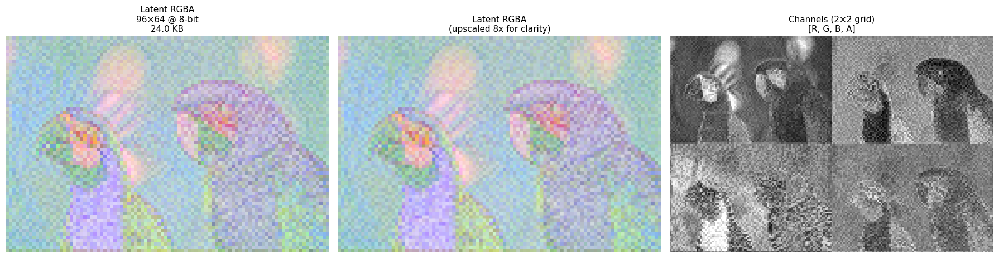

Latent shape: (1, 4, 64, 96)
Latent size: 24.0 KB

Channel statistics:
  R: mean=100.7, std=40.1, range=[24, 255]
  G: mean=127.5, std=42.6, range=[0, 243]
  B: mean=147.5, std=43.6, range=[9, 255]
  A: mean=126.3, std=28.3, range=[46, 241]


C:\Users\mdahl\.conda\envs\pytorch-5090\Lib\site-packages\skimage\metrics\simple_metrics.py:168: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range**2) / err)


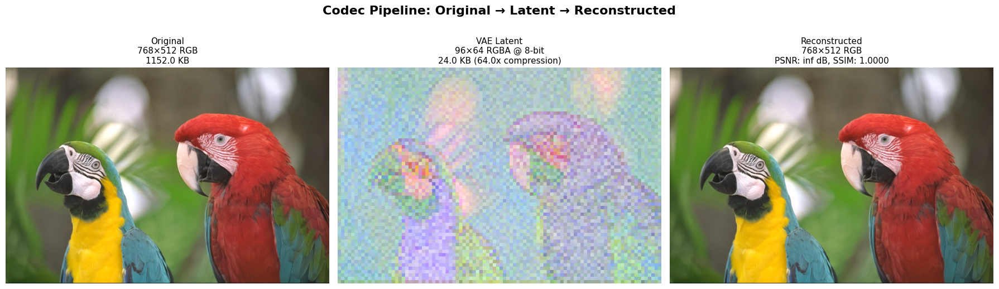

In [12]:
# Load test image
original_image = Image.open(test_image_path)
print(f"Image size: {original_image.size}")
print(f"Image mode: {original_image.mode}")
original_image

config = CodecConfig(quant_bits=8, tau=0)
compressed = compress_image(original_image, vae, config, device)
visualize_latent(compressed, show_channels=True)
compare_with_latent(original_image, compressed, vae, device)


Analyzing Hadamard transform...
Hadamard Transform Analysis

Original Channels:
  C0: var=633.9, range=169, energy=19.3%
  C1: var=709.6, range=160, energy=25.4%
  C2: var=781.6, range=185, energy=30.7%
  C3: var=313.9, range=121, energy=24.6%

Transformed Channels:
  Y: var=196.1, range=86, energy=96.9%
  U: var=150.1, range=80, energy=0.9%
  V: var=152.9, range=91, energy=1.2%
  W: var=110.6, range=76, energy=1.0%

⚠️ W has 56.4% of Y's variance → May not benefit much


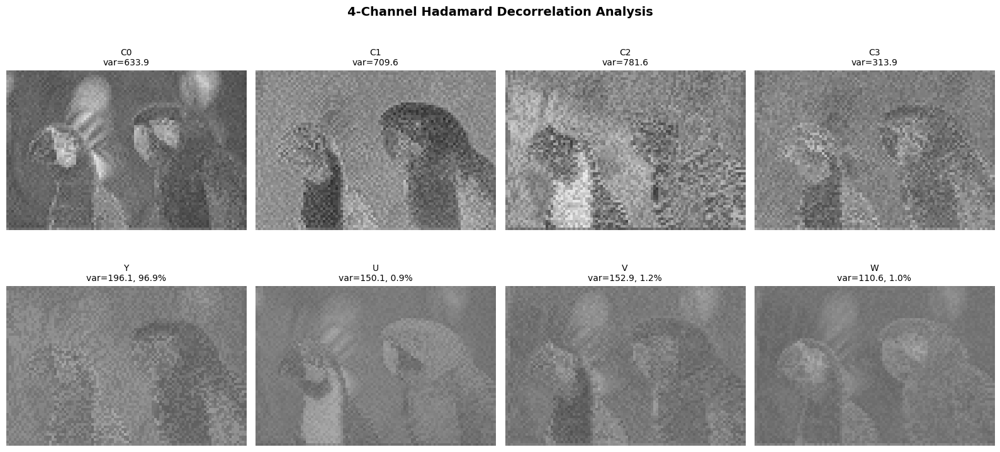


Testing Invertibility
Max reconstruction error: 0.000000
✅ Transform is lossless (within rounding)

Compression Comparison

Compression Comparison (yuv_w_alpha):
  Original RGBA: 20.47 KB
  Hadamard total: 16.45 KB
  Savings: 19.6%

Compression Comparison (yuvw_separate):
  Original RGBA: 20.47 KB
  Hadamard total: 16.56 KB
  Savings: 19.1%

Summary
Original RGBA:    20.47 KB
Hadamard RGBA:    16.45 KB (+19.6%)
Hadamard YUV+W:   16.56 KB (+19.1%)

W Channel Analysis (candidate for alpha)
W variance: 110.6
W dynamic range: 76
W energy: 1.0% of total
✅ W has low variance - good candidate for alpha channel!


In [13]:
# TEST CELL: Add after loading your image and compressing
# This tests the Hadamard transform and compares compression

# Compress image
config = CodecConfig(quant_bits=8, quant_clip=4.0, tau=0)
compressed = compress_image(original_image, vae, config, device)

# Analyze Hadamard transform (shows energy distribution)
print("Analyzing Hadamard transform...")
stats = analyze_hadamard_transform(compressed, show_plot=True)

# Test invertibility
print("\n" + "="*60)
print("Testing Invertibility")
print("="*60)

latent = compressed.quantized_latent.squeeze(0)
Y, U, V, W = hadamard_4ch_forward(latent)
reconstructed = hadamard_4ch_inverse(Y, U, V, W)

max_error = np.max(np.abs(latent.astype(float) - reconstructed.astype(float)))
print(f"Max reconstruction error: {max_error:.6f}")
if max_error < 1.0:
    print("✅ Transform is lossless (within rounding)")
else:
    print("⚠️ Some precision loss detected")

# Compare compression methods
print("\n" + "="*60)
print("Compression Comparison")
print("="*60)

output_dir = Path("./output_hadamard_test")

# Method 1: Original RGBA
result_orig = compress_with_hadamard(
    compressed, output_dir / "original", mode='yuv_w_alpha')

# Method 2: Separate YUV + W
result_sep = compress_with_hadamard(
    compressed, output_dir / "separate", mode='yuvw_separate')

print("\n" + "="*60)
print("Summary")
print("="*60)
print(f"Original RGBA:    {result_orig['original_size']/1024:.2f} KB")
print(
    f"Hadamard RGBA:    {result_orig['total_size']/1024:.2f} KB ({result_orig['savings_pct']:+.1f}%)")
print(
    f"Hadamard YUV+W:   {result_sep['total_size']/1024:.2f} KB ({result_sep['savings_pct']:+.1f}%)")

# Show W channel to verify low variance
print("\n" + "="*60)
print("W Channel Analysis (candidate for alpha)")
print("="*60)
w_stats = stats['W']
print(f"W variance: {w_stats['variance']:.1f}")
print(f"W dynamic range: {w_stats['dynamic_range']:.0f}")
print(f"W energy: {w_stats['energy_pct']:.1f}% of total")

if w_stats['variance'] < 1000:
    print("✅ W has low variance - good candidate for alpha channel!")
else:
    print("⚠️ W has high variance - may not compress well in alpha")




# Reconstruct latent from hadamard

C:\Users\mdahl\AppData\Local\Temp\ipykernel_3652\1313954304.py:59: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  display(Image.fromarray(reconstructed.transpose(1, 2, 0), mode='RGBA'))


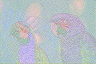

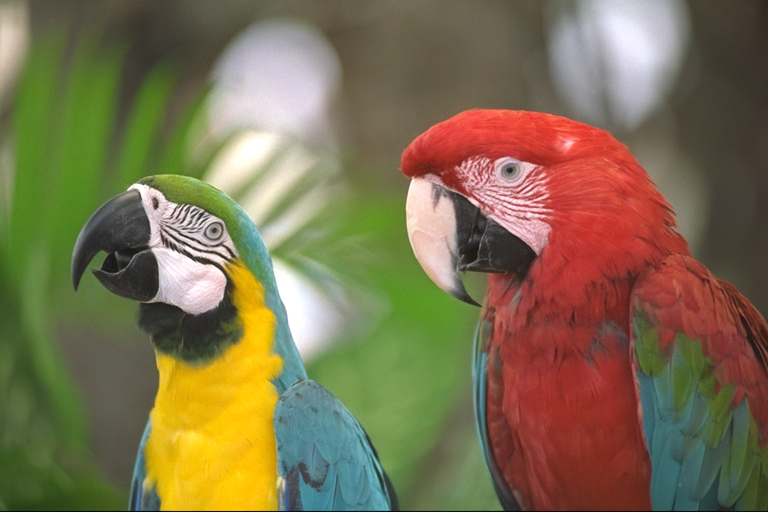

In [14]:
from IPython.display import display
import numpy as np
from PIL import Image
from scipy.ndimage import gaussian_filter

# ------------------------------------------------------------
# USER CONTROLS
# ------------------------------------------------------------

sU = 1
sV = 1
sW = 1
sY = 1

sigma_U = 0.3
sigma_V = 0.3
sigma_W = 0.3
sigma_Y = 0.1

# ------------------------------------------------------------

# 1) Start from the ORIGINAL quantized latent bytes
latent_u8 = compressed.quantized_latent.squeeze(0)   # (4, H, W) uint8

# 2) Hadamard forward
Y, U, V, W = hadamard_4ch_forward(latent_u8, normalize=True)

# 3) Scale UVW
U *= float(sU)
V *= float(sV)
W *= float(sW)
Y *= float(sY)

# 4) Gaussian blur UVW (NEW)
if sigma_U > 0:
    U = gaussian_filter(U, sigma=sigma_U)
if sigma_V > 0:
    V = gaussian_filter(V, sigma=sigma_V)
if sigma_W > 0:
    W = gaussian_filter(W, sigma=sigma_W)
if sigma_Y > 0:
    Y = gaussian_filter(Y, sigma=sigma_Y)

# 5) Inverse Hadamard → reconstructed latent (float)
reconstructed_f = hadamard_4ch_inverse(
    Y, U, V, W,
    normalized=True,
    clip_output=False
)

# 6) Convert to uint8 latent bytes
reconstructed = np.clip(np.rint(reconstructed_f), 0, 255).astype(np.uint8)

# ------------------------------------------------------------
# Original pipeline (unchanged)
# ------------------------------------------------------------

# Visualize reconstructed latent
display(Image.fromarray(reconstructed.transpose(1, 2, 0), mode='RGBA'))
compressed_latent = reconstructed[np.newaxis, :, :, :]
reconstructed_compressed_data = CompressedData(
    quantized_latent=compressed_latent,
    residual=compressed.residual,
    config=compressed.config,
    metadata=compressed.metadata
)

final_rgb = decompress_image(reconstructed_compressed_data, vae, device)
display(Image.fromarray(final_rgb))


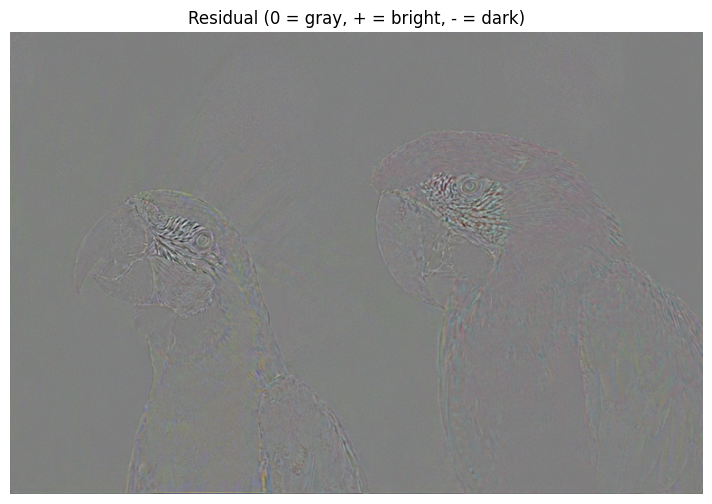

In [15]:
import numpy as np
import matplotlib.pyplot as plt

residual = compressed.residual  # (H, W, 3), int16

# Map [-range, +range] → [0, 255]; 0 residual → 128
r = np.clip(residual.astype(np.float32), -128, 127)
display_img = (r + 128).astype(np.uint8)

plt.figure(figsize=(10, 6))
plt.imshow(display_img)
plt.axis('off')
plt.title('Residual (0 = gray, + = bright, - = dark)')
plt.show()

In [16]:
from pathlib import Path
import numpy as np

# ---------------------------
# INPUT: your modified latent
# ---------------------------
# compressed_latent MUST be uint8 with shape (1,4,H,W) or (4,H,W)
if compressed_latent.ndim == 3:
    compressed_latent = compressed_latent[np.newaxis, :, :, :]
assert compressed_latent.ndim == 4 and compressed_latent.shape[1] == 4, compressed_latent.shape
compressed_latent = compressed_latent.astype(np.uint8)

# Wrap modified latent so existing code can encode it
compressed_mod = CompressedData(
    quantized_latent=compressed_latent,
    residual=compressed.residual,
    config=compressed.config,
    metadata=compressed.metadata
)

out = Path("./output_hadamard_blur_test")
out.mkdir(exist_ok=True, parents=True)

# ---------------------------
# Size comparison (baseline vs modified)
# ---------------------------
print("=== Baseline (no blur/scale) ===")
base = compress_with_hadamard(compressed, out / "base", mode="yuv_w_alpha")

print("\n=== Modified (blur/scale UVW) ===")
mod  = compress_with_hadamard(compressed_mod, out / "mod", mode="yuv_w_alpha")

print("\n=== Delta ===")
print(f"Baseline total: {base['total_size']/1024:.2f} KB")
print(f"Modified total: {mod['total_size']/1024:.2f} KB")
print(f"Change: {(mod['total_size']/base['total_size'] - 1)*100:+.2f}%")

# ---------------------------
# Shannon entropy utilities (DISCRETE, fixed bins)
# ---------------------------
def entropy_u8(arr_u8: np.ndarray) -> float:
    """0th-order Shannon entropy (bits/sample) for uint8 symbols."""
    x = arr_u8.astype(np.uint8).ravel()
    hist = np.bincount(x, minlength=256).astype(np.float64)
    p = hist / hist.sum()
    p = p[p > 0]
    return float(-(p * np.log2(p)).sum())

def entropy_u8_ac(arr_u8: np.ndarray) -> float:
    """Entropy of AC (mean-subtracted) after rounding back to uint8 alphabet."""
    x = arr_u8.astype(np.int16)
    ac = x - int(np.rint(x.mean()))
    ac = np.clip(ac, -128, 127).astype(np.int16)      # keep in small range
    ac_u8 = (ac + 128).astype(np.uint8)               # map to 0..255 symbols
    return entropy_u8(ac_u8)

def entropy_diff_u8(arr_u8: np.ndarray) -> float:
    """Entropy of first differences (predictability proxy)."""
    x = arr_u8.astype(np.int16)
    dx = np.diff(x, axis=1).ravel()
    dy = np.diff(x, axis=0).ravel()
    # diffs in [-255,255] -> shift to [0,510]
    def ent_signed(d):
        d = (d + 255).astype(np.int32)
        hist = np.bincount(d, minlength=511).astype(np.float64)
        p = hist / hist.sum()
        p = p[p > 0]
        return float(-(p * np.log2(p)).sum())
    return 0.5 * (ent_signed(dx) + ent_signed(dy))

# ---------------------------
# Entropy in TWO domains:
#   (A) C0..C3 latent bytes
#   (B) Packed Y,U,V,W bytes that AVIF actually encodes (yuv_w_alpha)
# ---------------------------

latent_base = compressed.quantized_latent.squeeze(0)      # (4,H,W) uint8
latent_mod  = compressed_mod.quantized_latent.squeeze(0)  # (4,H,W) uint8

print("\n=== Shannon Entropy: Latent C0..C3 (bytes) ===")
print("Chan | H_raw | H_ac | H_diff")
print("-"*34)
for i, name in enumerate(["C0","C1","C2","C3"]):
    cb = latent_base[i]
    cm = latent_mod[i]
    print(f"{name} base | {entropy_u8(cb):5.3f} | {entropy_u8_ac(cb):5.3f} | {entropy_diff_u8(cb):6.3f}")
    print(f"{name} mod  | {entropy_u8(cm):5.3f} | {entropy_u8_ac(cm):5.3f} | {entropy_diff_u8(cm):6.3f}")
    print("-"*34)

# Packed domain (what compress_with_hadamard encodes)
Yb, Ub, Vb, Wb = hadamard_4ch_forward(latent_base, normalize=True)
Ym, Um, Vm, Wm = hadamard_4ch_forward(latent_mod,  normalize=True)

rgba_b = hadamard_4ch_to_image(Yb, Ub, Vb, Wb, mode="yuv_w_alpha")["rgba"]  # (H,W,4) uint8
rgba_m = hadamard_4ch_to_image(Ym, Um, Vm, Wm, mode="yuv_w_alpha")["rgba"]

print("\n=== Shannon Entropy: Packed Y,U,V,W (what AVIF sees) ===")
print("Plane | H_raw(base/mod) | H_ac(base/mod) | H_diff(base/mod)")
print("-"*60)
for k, nm in enumerate(["Y","U","V","W"]):
    pb, pm = rgba_b[...,k], rgba_m[...,k]
    print(
        f"{nm:>5} | "
        f"{entropy_u8(pb):6.3f}/{entropy_u8(pm):6.3f} | "
        f"{entropy_u8_ac(pb):6.3f}/{entropy_u8_ac(pm):6.3f} | "
        f"{entropy_diff_u8(pb):6.3f}/{entropy_diff_u8(pm):6.3f}"
    )


=== Baseline (no blur/scale) ===

Compression Comparison (yuv_w_alpha):
  Original RGBA: 20.47 KB
  Hadamard total: 16.45 KB
  Savings: 19.6%

=== Modified (blur/scale UVW) ===

Compression Comparison (yuv_w_alpha):
  Original RGBA: 20.46 KB
  Hadamard total: 16.44 KB
  Savings: 19.6%

=== Delta ===
Baseline total: 16.45 KB
Modified total: 16.44 KB
Change: -0.09%

=== Shannon Entropy: Latent C0..C3 (bytes) ===
Chan | H_raw | H_ac | H_diff
----------------------------------
C0 base | 6.416 | 6.416 |  6.056
C0 mod  | 6.417 | 6.417 |  6.056
----------------------------------
C1 base | 6.639 | 6.639 |  6.548
C1 mod  | 6.640 | 6.640 |  6.546
----------------------------------
C2 base | 6.804 | 6.804 |  6.852
C2 mod  | 6.800 | 6.800 |  6.840
----------------------------------
C3 base | 6.142 | 6.142 |  6.388
C3 mod  | 6.143 | 6.143 |  6.387
----------------------------------

=== Shannon Entropy: Packed Y,U,V,W (what AVIF sees) ===
Plane | H_raw(base/mod) | H_ac(base/mod) | H_diff(base/mod)


PSNR(original vs final_from_hadamard_latent): 49.8844 dB
MaxErr: 27


C:\Users\mdahl\AppData\Local\Temp\ipykernel_3652\3359510788.py:47: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  display(Image.fromarray(final_rgb, mode="RGB"))


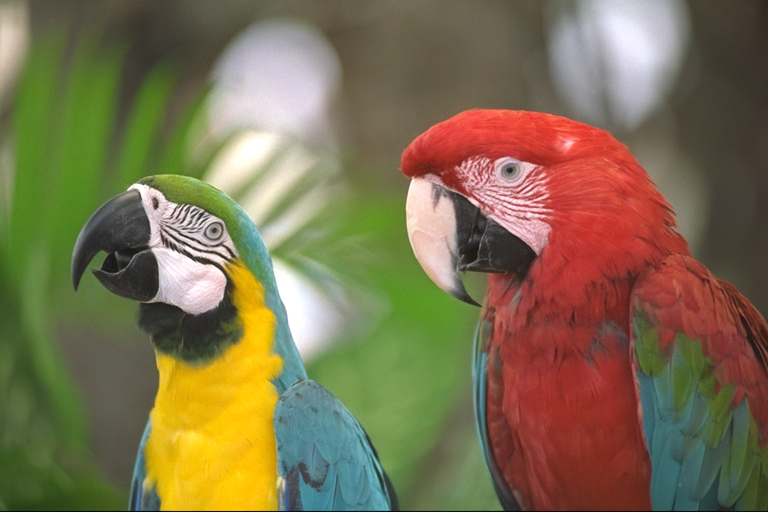

In [17]:
import numpy as np
from PIL import Image
from IPython.display import display

def psnr_uint8(a: np.ndarray, b: np.ndarray, data_range: float = 255.0) -> float:
    """PSNR for uint8 images. Returns +inf if identical."""
    a = a.astype(np.float64)
    b = b.astype(np.float64)
    mse = np.mean((a - b) ** 2)
    if mse == 0:
        return float("inf")
    return 10.0 * np.log10((data_range ** 2) / mse)

# --- 1) Get original RGB ground truth ---
orig_rgb = np.array(original_image.convert("RGB"), dtype=np.uint8)

# --- 2) Hadamard forward/inverse from the *latent* ---
latent = compressed.quantized_latent.squeeze(0)   # (4, H, W) uint8
Y, U, V, W = hadamard_4ch_forward(compressed_latent, normalize=True)

# IMPORTANT: avoid clipping/uint8 during inverse if you want a "true" invertibility check.
# For the codec path, you'll likely end up in uint8 anyway, but let's be explicit:
reconstructed_latent_f = hadamard_4ch_inverse(Y, U, V, W, normalized=True, clip_output=False)  # (4,H,W) float32

# For the current storage scheme (your pipeline expects uint8 latent):
reconstructed_latent_u8 = np.clip(np.rint(reconstructed_latent_f), 0, 255).astype(np.uint8)   # (4,H,W)

# --- 3) Build CompressedData with reconstructed latent + same residual ---
reconstructed_compressed_data = CompressedData(
    quantized_latent=reconstructed_latent_u8 ,  # (1,4,H,W)
    residual=compressed.residual,
    config=compressed.config,
    metadata=compressed.metadata
)

# --- 4) Decompress full image from reconstructed latent ---
final_rgb = decompress_image(reconstructed_compressed_data, vae, device)  # should be (H,W,3) uint8

# --- 5) Metrics ---
psnr_val = psnr_uint8(orig_rgb, final_rgb)
max_err = int(np.max(np.abs(orig_rgb.astype(np.int8) - final_rgb.astype(np.int8))))

print(f"PSNR(original vs final_from_hadamard_latent): {psnr_val:.4f} dB")
print(f"MaxErr: {max_err}")

# --- 6) Visual sanity ---
display(Image.fromarray(final_rgb, mode="RGB"))


In [18]:
orig_rgb = np.array(original_image.convert("RGB"), dtype=np.uint8)

# VAE-only decode of modified latent (no residual)
vae_only_mod = decode_latent(
    dequantise_latent(reconstructed[np.newaxis, :, :, :], compressed.metadata["latent_meta"], device),
    vae, device
)

# Final (with ORIGINAL residual)
final_mod = final_rgb

from math import log10
def psnr(a,b):
    a=a.astype(np.float64); b=b.astype(np.float64)
    mse=np.mean((a-b)**2)
    return float("inf") if mse==0 else 10*log10((255**2)/mse)

print("PSNR VAE-only(mod) vs original:", psnr(orig_rgb, vae_only_mod))
print("PSNR Final(mod+old_residual) vs original:", psnr(orig_rgb, final_mod))
print("MaxErr VAE-only(mod):", np.max(np.abs(orig_rgb.astype(np.int16)-vae_only_mod.astype(np.int16))))
print("MaxErr Final(mod):", np.max(np.abs(orig_rgb.astype(np.int16)-final_mod.astype(np.int16))))


PSNR VAE-only(mod) vs original: 33.10855488965699
PSNR Final(mod+old_residual) vs original: 49.88442730821916
MaxErr VAE-only(mod): 126
MaxErr Final(mod): 27


In [19]:
latent_u8 = compressed.quantized_latent.squeeze(0).astype(np.int8)   # (4,H,W)
recon_u8  = reconstructed_latent_u8.astype(np.int8)

d = recon_u8 - latent_u8
print("Max latent abs diff:", np.max(np.abs(d)))
print("Mean latent abs diff:", np.mean(np.abs(d)))

# Byte domain check
latent_u8 = compressed.quantized_latent.squeeze(0).astype(np.int16)
Y,U,V,W = hadamard_4ch_forward(latent_u8.astype(np.uint8), normalize=True)
recon_f = hadamard_4ch_inverse(Y,U,V,W, normalized=True, clip_output=False)
recon_u8 = np.clip(np.rint(recon_f),0,255).astype(np.uint8)

print("byte-domain max diff:", np.max(np.abs(recon_u8.astype(np.int16) - latent_u8)))

# Dequantized latent domain check (the one that matters for VAE decode)
meta = compressed.metadata["latent_meta"]
L = dequantise_latent(compressed.quantized_latent, meta, device)  # float latent, shape (1,4,H,W)

L_np = L.squeeze(0).cpu().numpy()  # float32
# apply hadamard on float channels here, then invert, then compare to L_np

import numpy as np

# A) Original quantized bytes (ground truth for hadamard on bytes)
L0 = compressed.quantized_latent.squeeze(0)          # (4,H,W) uint8

# B) Direct hadamard inverse result (NO storage packing)
Y,U,V,W = hadamard_4ch_forward(L0, normalize=True)
L1_f = hadamard_4ch_inverse(Y,U,V,W, normalized=True, clip_output=False)  # float (4,H,W)
L1 = np.clip(np.rint(L1_f), 0, 255).astype(np.uint8)

# C) Your "storage packing" round-trip (THIS is where errors should appear, if any)
imgs = hadamard_4ch_to_image(Y,U,V,W, mode="yuv_w_alpha")   # or yuvw_separate
Y2,U2,V2,W2 = image_to_hadamard_4ch(imgs)
L2_f = hadamard_4ch_inverse(Y2,U2,V2,W2, normalized=True, clip_output=False)
L2 = np.clip(np.rint(L2_f), 0, 255).astype(np.uint8)

def report(name, A, B):
    d = A.astype(np.int16) - B.astype(np.int16)
    print(f"{name}: max={np.max(np.abs(d))}, mean={np.mean(np.abs(d)):.6f}")

report("B) direct inverse vs original bytes", L1, L0)
report("C) packed round-trip vs original bytes", L2, L0)



Max latent abs diff: 1
Mean latent abs diff: 0.023396809895833332
byte-domain max diff: 0
B) direct inverse vs original bytes: max=0, mean=0.000000
C) packed round-trip vs original bytes: max=3, mean=0.559774


## Experiment Configuration

Define compression parameters matching run_experiments.py

In [20]:
# Define experiments with CodecConfig dataclass
import json
EXPERIMENTS = [
    {
        'name': 'NPZ NoBlur',
        'outdir': './output_npz',
        'config': CodecConfig(
            quant_bits=8,
            quant_clip=4.5,
            tau=0,
            kernel_type='gaussian',
            kernel_size=3,
            kernel_sigma=1,
            residual_format='npz'
        )
    },
    {
        'name': 'NPZ Blur 1',
        'outdir': './output_npz_1',
        'config': CodecConfig(
            quant_bits=8,
            quant_clip=4.5,
            tau=1,
            kernel_type='gaussian',
            kernel_size=3,
            kernel_sigma=1,
            residual_format='npz'
        )
    },
        {
        'name': 'NPZ Blur 3',
        'outdir': './output_npz_3',
        'config': CodecConfig(
            quant_bits=8,
            quant_clip=4.5,
            tau=2,
            kernel_type='gaussian',
            kernel_size=3,
            kernel_sigma=1,
            residual_format='npz'
        )
    },
        {
        'name': 'NPZ Blur 5',
        'outdir': './output_npz_5',
        'config': CodecConfig(
            quant_bits=8,
            quant_clip=4.5,
            tau=3,
            kernel_type='gaussian',
            kernel_size=3,
            kernel_sigma=1,
            residual_format='npz'
        )
    },
        {
        'name': 'NPZ Blur 7',
        'outdir': './output_npz_7',
        'config': CodecConfig(
            quant_bits=8,
            quant_clip=4.5,
            tau=4,
            kernel_type='gaussian',
            kernel_size=3,
            kernel_sigma=1,
            residual_format='npz'
        )
    },
        {
        'name': 'NPZ Blur 9',
        'outdir': './output_npz_9',
        'config': CodecConfig(
            quant_bits=8,
            quant_clip=4.5,
            tau=5,
            kernel_type='gaussian',
            kernel_size=3,
            kernel_sigma=1,
            residual_format='npz'
        )
    },
    {
        'name': 'NPZ Blur 11',
        'outdir': './output_npz_9',
        'config': CodecConfig(
            quant_bits=8,
            quant_clip=4.5,
            tau=6,
            kernel_type='gaussian',
            kernel_size=3,
            kernel_sigma=1,
            residual_format='npz'
        )
    },
]

print(f"Running {len(EXPERIMENTS)} experiments:")
for exp in EXPERIMENTS:
    cfg = exp['config']
    print(
        f"  - {exp['name']}: {cfg.quant_bits}-bit latent, tau={cfg.tau}, format={cfg.residual_format}")



Running 7 experiments:
  - NPZ NoBlur: 8-bit latent, tau=0, format=npz
  - NPZ Blur 1: 8-bit latent, tau=1, format=npz
  - NPZ Blur 3: 8-bit latent, tau=2, format=npz
  - NPZ Blur 5: 8-bit latent, tau=3, format=npz
  - NPZ Blur 7: 8-bit latent, tau=4, format=npz
  - NPZ Blur 9: 8-bit latent, tau=5, format=npz
  - NPZ Blur 11: 8-bit latent, tau=6, format=npz


In [21]:
# =============================================================================
# VERIFICATION TEST: Confirm Bugfixes for Lossless Reconstruction
# =============================================================================
print("="*80)
print("BUGFIX VERIFICATION TEST")
print("="*80)
print("\nThis test verifies the fixes from BUGFIX1.md and BUGFIX2.md:")
print("  Fix 1: Asymmetric blur in compress_image()")
print("  Fix 2: tau<=0 check in quantize_residual_near_lossless()")
print()

# Test 1: Identity kernel (no blur) with tau=0 should be perfectly lossless
print("Test 1: Identity kernel + tau=0 (should be lossless)")
print("-" * 60)
config_identity = CodecConfig(
    quant_bits=8,
    quant_clip=2.5,
    tau=0,
    kernel_type="identity",  # No blur
    kernel_size=3,
    kernel_sigma=0.5,
    residual_format='npz'
)

compressed_identity = compress_image(original_image, vae, config_identity, device)
eval_identity = evaluate_compression(original_image, compressed_identity, vae, device)

print(f"  PSNR: {eval_identity.metrics['final']['PSNR']:.2f} dB")
print(f"  MaxError: {eval_identity.metrics['final']['MaxError']}")
print(f"  SSIM: {eval_identity.metrics['final']['SSIM']:.4f}")

if eval_identity.metrics['final']['MaxError'] == 0:
    print("  ✓ PASS: Perfect lossless reconstruction (MaxError=0)")
else:
    print(f"  ✗ FAIL: Expected MaxError=0, got {eval_identity.metrics['final']['MaxError']}")

print()

# Test 2: Gaussian blur with tau=0 should reconstruct blur(original)
# The fix ensures: final = blur(vae_decoded) + (original - blur(vae_decoded)) = original
print("Test 2: Gaussian blur + tau=0 (residual should compensate for blur)")
print("-" * 60)
config_gaussian = CodecConfig(
    quant_bits=8,
    quant_clip=2.5,
    tau=0,
    kernel_type="gaussian",
    kernel_size=3,
    kernel_sigma=0.5,
    residual_format='npz'
)

compressed_gaussian = compress_image(original_image, vae, config_gaussian, device)
eval_gaussian = evaluate_compression(original_image, compressed_gaussian, vae, device)

print(f"  PSNR: {eval_gaussian.metrics['final']['PSNR']:.2f} dB")
print(f"  MaxError: {eval_gaussian.metrics['final']['MaxError']}")
print(f"  SSIM: {eval_gaussian.metrics['final']['SSIM']:.4f}")

# With the fix, we should get perfect reconstruction of the original
# (not the blurred version) because:
# final = blur(vae_decoded) + (original - blur(vae_decoded)) = original
if eval_gaussian.metrics['final']['MaxError'] == 0:
    print("  ✓ PASS: Perfect reconstruction with symmetric blur (MaxError=0)")
elif eval_gaussian.metrics['final']['MaxError'] <= 2:
    print(f"  ✓ PASS: Near-perfect reconstruction (MaxError={eval_gaussian.metrics['final']['MaxError']} ≤ 2)")
    print("     Note: Small errors may occur due to floating-point rounding in blur operation")
else:
    print(f"  ✗ FAIL: Expected MaxError ≈ 0, got {eval_gaussian.metrics['final']['MaxError']}")

print()

# Test 3: Verify quantize_residual_near_lossless accepts tau=0
print("Test 3: quantize_residual_near_lossless() with tau=0")
print("-" * 60)
try:
    test_residual = np.array([[1, 2], [3, 4]], dtype=np.int16)
    quantized = quantize_residual_near_lossless(test_residual, tau=0)
    if np.array_equal(quantized, test_residual):
        print("  ✓ PASS: tau=0 returns lossless copy")
    else:
        print("  ✗ FAIL: tau=0 should return exact copy")
except ValueError as e:
    print(f"  ✗ FAIL: tau=0 raised ValueError: {e}")

print()
print("="*80)
print("BUGFIX VERIFICATION COMPLETE")
print("="*80)
print()
print("Summary:")
print(f"  Identity kernel (no blur):  MaxError = {eval_identity.metrics['final']['MaxError']}, "
      f"PSNR = {eval_identity.metrics['final']['PSNR']:.2f} dB")
print(f"  Gaussian blur:              MaxError = {eval_gaussian.metrics['final']['MaxError']}, "
      f"PSNR = {eval_gaussian.metrics['final']['PSNR']:.2f} dB")
print()
print("Expected results:")
print("  - Identity kernel should achieve MaxError=0 (perfect lossless)")
print("  - Gaussian blur should achieve MaxError ≈ 0 (limited by floating-point precision)")
print("  - Both should have PSNR >> 40 dB (often reported as infinity for MaxError=0)")
print()

BUGFIX VERIFICATION TEST

This test verifies the fixes from BUGFIX1.md and BUGFIX2.md:
  Fix 1: Asymmetric blur in compress_image()
  Fix 2: tau<=0 check in quantize_residual_near_lossless()

Test 1: Identity kernel + tau=0 (should be lossless)
------------------------------------------------------------
  PSNR: inf dB
  MaxError: 0
  SSIM: 1.0000
  ✓ PASS: Perfect lossless reconstruction (MaxError=0)

Test 2: Gaussian blur + tau=0 (residual should compensate for blur)
------------------------------------------------------------
  PSNR: inf dB
  MaxError: 0
  SSIM: 1.0000
  ✓ PASS: Perfect reconstruction with symmetric blur (MaxError=0)

Test 3: quantize_residual_near_lossless() with tau=0
------------------------------------------------------------
  ✓ PASS: tau=0 returns lossless copy

BUGFIX VERIFICATION COMPLETE

Summary:
  Identity kernel (no blur):  MaxError = 0, PSNR = inf dB
  Gaussian blur:              MaxError = 0, PSNR = inf dB

Expected results:
  - Identity kernel should 

## Run Compression Experiments

Execute compression for each experiment configuration.

In [22]:

# Run compression experiments
results = []

for exp in EXPERIMENTS:
    name = exp['name']
    output_dir = Path(exp['outdir'])
    config = exp['config']

    print(f"\n{'='*60}")
    print(f"Experiment: {name}")
    print(f"{'='*60}")

    # Compress (all operations in one call)
    t_start = time.time()
    compressed = compress_image(original_image, vae, config, device)
    t_compress = time.time() - t_start

    # Save to disk
    sizes = save_compressed(compressed, output_dir)
    total_size = sum(sizes.values())
    original_size = original_image.size[0] * original_image.size[1] * 3

    # Store result
    results.append({
        'experiment': name,
        'compressed_data': compressed,
        'output_dir': output_dir,
        'sizes': sizes,
        'compression_ratio': original_size / total_size,
        'timing': {'compress': t_compress}
    })

    print(
        f"  Compressed: {total_size/1024:.1f} KB ({results[-1]['compression_ratio']:.2f}x)")
    print(f"  Time: {t_compress:.2f}s")

print(f"\n{'='*60}")
print(f"Compression completed for {len(EXPERIMENTS)} experiments")
print(f"{'='*60}")



Experiment: NPZ NoBlur
  Compressed: 752.4 KB (1.53x)
  Time: 0.09s

Experiment: NPZ Blur 1
  Compressed: 539.2 KB (2.14x)
  Time: 0.09s

Experiment: NPZ Blur 3
  Compressed: 372.7 KB (3.09x)
  Time: 0.09s

Experiment: NPZ Blur 5
  Compressed: 272.4 KB (4.23x)
  Time: 0.09s

Experiment: NPZ Blur 7
  Compressed: 210.0 KB (5.49x)
  Time: 0.09s

Experiment: NPZ Blur 9
  Compressed: 164.9 KB (6.99x)
  Time: 0.08s

Experiment: NPZ Blur 11
  Compressed: 131.2 KB (8.78x)
  Time: 0.09s

Compression completed for 7 experiments


## Run Decompression

Decompress and reconstruct images.

In [23]:

# Run decompression & evaluation
for idx, (exp, result) in enumerate(zip(EXPERIMENTS, results)):
    name = exp['name']
    compressed = result['compressed_data']

    print(f"\nEvaluating: {name}")

    # Evaluate (decompress + metrics in one call)
    #t_start = time.time()
    eval_result = evaluate_compression(original_image, compressed, vae, device)
    #t_decompress = time.time() - t_start

    # Update result
    result['eval'] = eval_result
    #result['timing']['decompress'] = t_decompress

    # Print metrics
    vae_metrics = eval_result.metrics['vae_only']
    final_metrics = eval_result.metrics['final']

    print(
        f"  VAE-only: PSNR={vae_metrics['PSNR']:.2f} dB, SSIM={vae_metrics['SSIM']:.4f}")
    print(
        f"  Final: PSNR={final_metrics['PSNR']:.2f} dB, SSIM={final_metrics['SSIM']:.4f}, MaxErr={final_metrics['MaxError']}")
    #print(f"  Time: {t_decompress:.2f}s")




Evaluating: NPZ NoBlur
  VAE-only: PSNR=33.20 dB, SSIM=0.9119
  Final: PSNR=inf dB, SSIM=1.0000, MaxErr=0

Evaluating: NPZ Blur 1
  VAE-only: PSNR=33.20 dB, SSIM=0.9119
  Final: PSNR=51.17 dB, SSIM=0.9950, MaxErr=1

Evaluating: NPZ Blur 3
  VAE-only: PSNR=33.20 dB, SSIM=0.9119
  Final: PSNR=46.45 dB, SSIM=0.9867, MaxErr=2

Evaluating: NPZ Blur 5
  VAE-only: PSNR=33.20 dB, SSIM=0.9119
  Final: PSNR=43.70 dB, SSIM=0.9779, MaxErr=3

Evaluating: NPZ Blur 7
  VAE-only: PSNR=33.20 dB, SSIM=0.9119
  Final: PSNR=41.88 dB, SSIM=0.9684, MaxErr=4

Evaluating: NPZ Blur 9
  VAE-only: PSNR=33.20 dB, SSIM=0.9118
  Final: PSNR=40.57 dB, SSIM=0.9593, MaxErr=5

Evaluating: NPZ Blur 11
  VAE-only: PSNR=33.20 dB, SSIM=0.9119
  Final: PSNR=39.63 dB, SSIM=0.9522, MaxErr=6


## Results Summary

Compare compression formats and metrics.

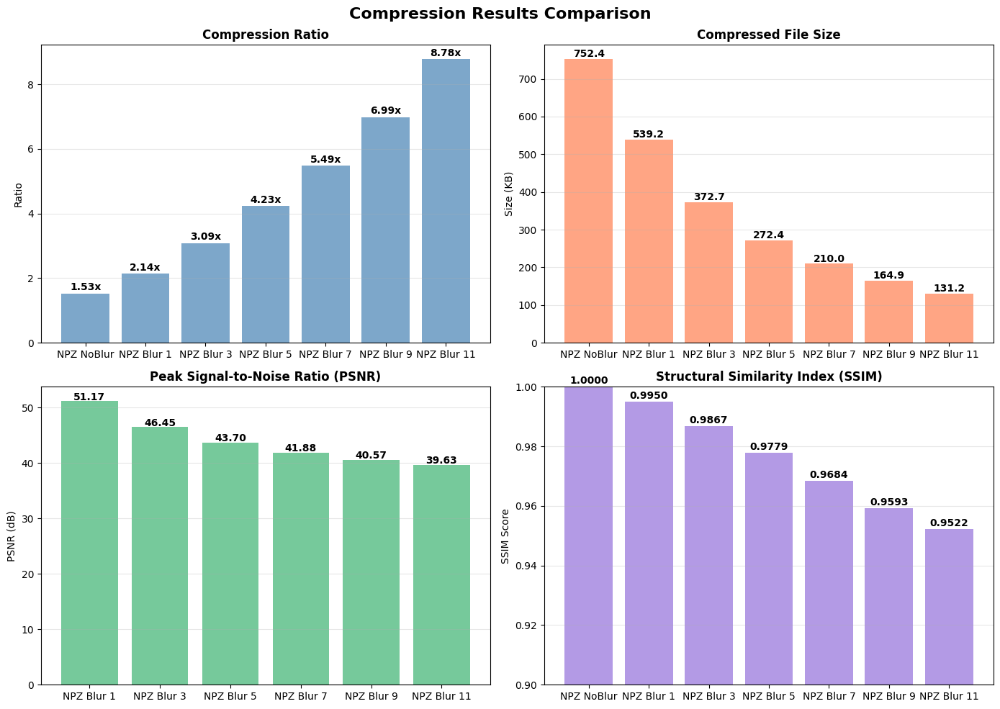


Detailed Results:
 Experiment Compression Ratio Size (KB) PSNR (dB)   SSIM
 NPZ NoBlur             1.53x     752.4       inf 1.0000
 NPZ Blur 1             2.14x     539.2     51.17 0.9950
 NPZ Blur 3             3.09x     372.7     46.45 0.9867
 NPZ Blur 5             4.23x     272.4     43.70 0.9779
 NPZ Blur 7             5.49x     210.0     41.88 0.9684
 NPZ Blur 9             6.99x     164.9     40.57 0.9593
NPZ Blur 11             8.78x     131.2     39.63 0.9522


In [24]:

# Results Summary with Visualizations
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Compression Results Comparison', fontsize=16, fontweight='bold')

# Extract data for plotting (NEW - cleaner API)
experiment_names = [r['experiment'] for r in results]
compression_ratios = [r['compression_ratio'] for r in results]
file_sizes = [sum(r['sizes'].values()) / 1024 for r in results]
psnr_values = [r['eval'].metrics['final']['PSNR'] for r in results]
ssim_values = [r['eval'].metrics['final']['SSIM'] for r in results]

# Plot 1: Compression Ratio
axes[0, 0].bar(experiment_names, compression_ratios, color='steelblue', alpha=0.7)
axes[0, 0].set_title('Compression Ratio', fontweight='bold')
axes[0, 0].set_ylabel('Ratio')
axes[0, 0].grid(axis='y', alpha=0.3)
for i, v in enumerate(compression_ratios):
    axes[0, 0].text(i, v + 0.1, f'{v:.2f}x', ha='center', fontweight='bold')

# Plot 2: File Size
axes[0, 1].bar(experiment_names, file_sizes, color='coral', alpha=0.7)
axes[0, 1].set_title('Compressed File Size', fontweight='bold')
axes[0, 1].set_ylabel('Size (KB)')
axes[0, 1].grid(axis='y', alpha=0.3)
for i, v in enumerate(file_sizes):
    axes[0, 1].text(i, v + 5, f'{v:.1f}', ha='center', fontweight='bold')

# Plot 3: PSNR
axes[1, 0].bar(experiment_names, psnr_values, color='mediumseagreen', alpha=0.7)
axes[1, 0].set_title('Peak Signal-to-Noise Ratio (PSNR)', fontweight='bold')
axes[1, 0].set_ylabel('PSNR (dB)')
axes[1, 0].grid(axis='y', alpha=0.3)
for i, v in enumerate(psnr_values):
    axes[1, 0].text(i, v + 0.2, f'{v:.2f}', ha='center', fontweight='bold')

# Plot 4: SSIM
axes[1, 1].bar(experiment_names, ssim_values, color='mediumpurple', alpha=0.7)
axes[1, 1].set_title('Structural Similarity Index (SSIM)', fontweight='bold')
axes[1, 1].set_ylabel('SSIM Score')
axes[1, 1].set_ylim(0.9, 1.0)
axes[1, 1].grid(axis='y', alpha=0.3)
for i, v in enumerate(ssim_values):
    axes[1, 1].text(i, v + 0.001, f'{v:.4f}', ha='center', fontweight='bold')

plt.tight_layout()
plt.savefig('compression_results.png', dpi=150, bbox_inches='tight')
plt.show()

# Display detailed results table
results_df = pd.DataFrame([
    {
        'Experiment': r['experiment'],
        'Compression Ratio': f"{r['compression_ratio']:.2f}x",
        'Size (KB)': f"{sum(r['sizes'].values()) / 1024:.1f}",
        'PSNR (dB)': f"{r['eval'].metrics['final']['PSNR']:.2f}",
        'SSIM': f"{r['eval'].metrics['final']['SSIM']:.4f}",
    }
    for r in results
])

print("\nDetailed Results:")
print(results_df.to_string(index=False))

## Visual Comparison

Display original and reconstructed images side-by-side.

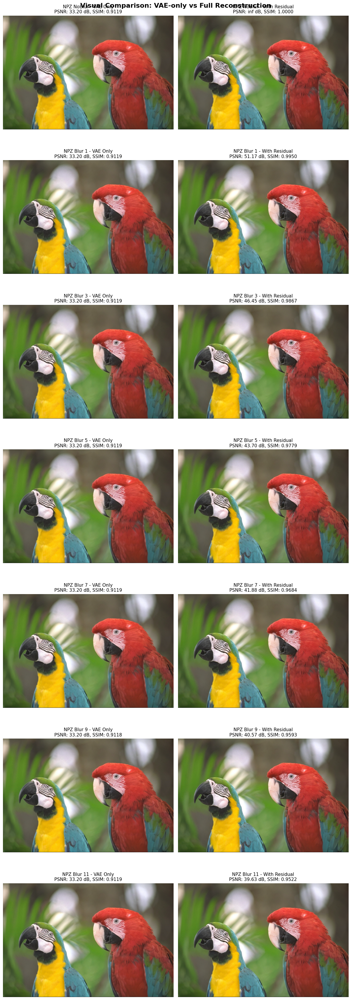

In [25]:

# Visual Comparison Grid
fig, axes = plt.subplots(
    len(EXPERIMENTS), 2, figsize=(12, 5 * len(EXPERIMENTS)))
if len(EXPERIMENTS) == 1:
    axes = axes.reshape(1, -1)

fig.suptitle('Visual Comparison: VAE-only vs Full Reconstruction',
             fontsize=16, fontweight='bold')

for idx, (exp_config, result) in enumerate(zip(EXPERIMENTS, results)):
    eval_result = result['eval']
    vae_metrics = eval_result.metrics['vae_only']
    final_metrics = eval_result.metrics['final']

    # VAE-only reconstruction
    axes[idx, 0].imshow(eval_result.vae_decoded)
    axes[idx, 0].axis('off')
    axes[idx, 0].set_title(
        f"{exp_config['name']} - VAE Only\nPSNR: {vae_metrics['PSNR']:.2f} dB, SSIM: {vae_metrics['SSIM']:.4f}",
        fontsize=11
    )

    # Full reconstruction with residual
    axes[idx, 1].imshow(eval_result.final_decoded)
    axes[idx, 1].axis('off')
    axes[idx, 1].set_title(
        f"{exp_config['name']} - With Residual\nPSNR: {final_metrics['PSNR']:.2f} dB, SSIM: {final_metrics['SSIM']:.4f}",
        fontsize=11
    )

plt.tight_layout()
plt.savefig('visual_comparison.png', dpi=150, bbox_inches='tight')
plt.show()



## Performance Analysis

Analyze timing and efficiency.

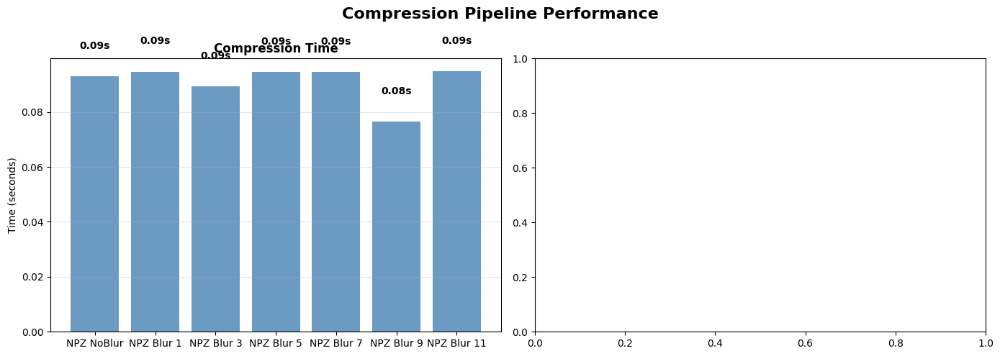


Timing Summary:
 Experiment Compression (s)
 NPZ NoBlur            0.09
 NPZ Blur 1            0.09
 NPZ Blur 3            0.09
 NPZ Blur 5            0.09
 NPZ Blur 7            0.09
 NPZ Blur 9            0.08
NPZ Blur 11            0.09


In [26]:
# Performance Analysis
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Compression Pipeline Performance', fontsize=16, fontweight='bold')

experiment_names = [r['experiment'] for r in results]

# Extract timing data
compress_times = [r['timing']['compress'] for r in results]
#decompress_times = [r['timing']['decompress'] for r in results]

# Plot 1: Compression Time
bars1 = axes[0].bar(experiment_names, compress_times, color='steelblue', alpha=0.8)
axes[0].set_title('Compression Time', fontweight='bold')
axes[0].set_ylabel('Time (seconds)')
axes[0].grid(axis='y', alpha=0.3)
for i, (bar, time) in enumerate(zip(bars1, compress_times)):
    axes[0].text(i, time + 0.01, f'{time:.2f}s', ha='center', fontweight='bold')

# Plot 2: Decompression Time
#bars2 = axes[1].bar(experiment_names, decompress_times, color='coral', alpha=0.8)
#axes[1].set_title('Decompression Time', fontweight='bold')
#axes[1].set_ylabel('Time (seconds)')
#axes[1].grid(axis='y', alpha=0.3)
#for i, (bar, time) in enumerate(zip(bars2, decompress_times)):
#    axes[1].text(i, time + 0.001, f'{time:.2f}s', ha='center', fontweight='bold')

plt.tight_layout()
plt.savefig('performance_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

# Summary table
timing_df = pd.DataFrame([
    {
        'Experiment': r['experiment'],
        'Compression (s)': f"{r['timing']['compress']:.2f}",
#        'Decompression (s)': f"{r['timing']['decompress']:.2f}",
#        'Total (s)': f"{r['timing']['compress'] + r['timing']['decompress']:.2f}",
    }
    for r in results
])

print("\nTiming Summary:")
print(timing_df.to_string(index=False))

# Optional: Show throughput
#for r in results:
    #total_time = r['timing']['compress'] + r['timing']['decompress']
    # Assume image is ~750KB (typical for test images)
    #throughput_mbps = (sum(r['sizes'].values()) / 1024 / 1024) / total_time
    #print(f"{r['experiment']}: {throughput_mbps:.2f} MB/s (compress+decompress)")


## Export Results

Save results as JSON and download visualizations.

In [27]:
# Export results and plots
import json

# Export results and plots

# Convert results to serializable format
results_export = {
    'experiments': [
        {
            'name': exp['name'],
            'config': {
                'quant_bits': exp['config'].quant_bits,
                'quant_clip': exp['config'].quant_clip,
                'tau': exp['config'].tau,
                'kernel': exp['config'].kernel_type,
                'residual_format': exp['config'].residual_format,
            }
        }
        for exp in EXPERIMENTS
    ],
    'results': [
        {
            'experiment': r['experiment'],
            'compression_ratio': r['compression_ratio'],
            'sizes': r['sizes'],
            'metrics': {
                'vae_only': r['eval'].metrics['vae_only'],
                'final': r['eval'].metrics['final']
            },
            'timing': r['timing'],
        }
        for r in results
    ]
}

# Save to JSON
with open('compression_results.json', 'w') as f:
    json.dump(results_export, f, indent=2, default=str)

print("Exported results to: compression_results.json")

Exported results to: compression_results.json


Perfect reconstruction: True  (Original)
Perfect reconstruction: True  (VAE Recon)


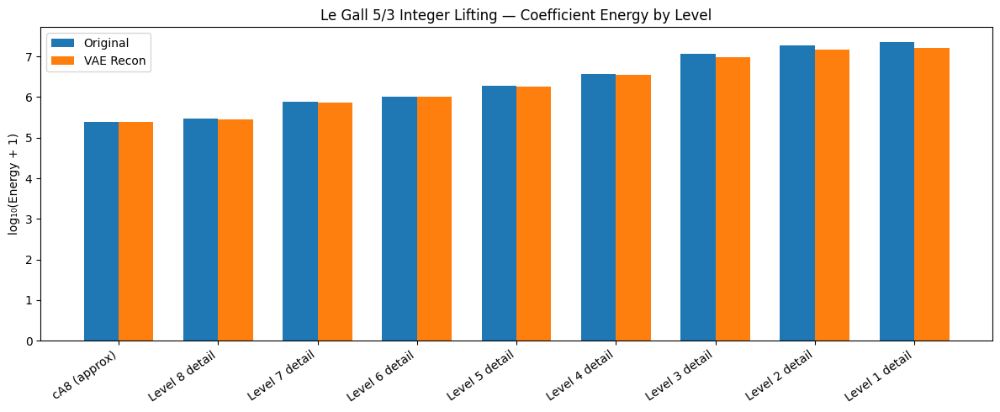


Level                        Original      VAE Recon  Ratio (R/O)
─────────────────────────────────────────────────────────────────
cA8 (approx)                 242325.0       243409.0      1.0045
Level 8 detail               292740.0       285697.0      0.9759
Level 7 detail               756821.0       741626.0      0.9799
Level 6 detail              1020088.0      1001735.0      0.9820
Level 5 detail              1906838.0      1807381.0      0.9478
Level 4 detail              3796628.0      3485614.0      0.9181
Level 3 detail             11659529.0      9809083.0      0.8413
Level 2 detail             18959406.0     14849000.0      0.7832
Level 1 detail             22606792.0     16002720.0      0.7079

orig_coeffs  and  recon_coeffs  stored  (3 channels × 9 levels each)
Transform: Le Gall 5/3 integer lifting (JPEG 2000 ITU-T T.800)


In [28]:
# ── Cell: Le Gall 5/3 Integer Lifting Wavelet (JPEG 2000 / ITU-T T.800) ─────
import numpy as np
import matplotlib.pyplot as plt

# ── 1) Le Gall 5/3 integer lifting primitives ──────────────────────────────

def _forward_lift_1d(x):
    """1-D forward Le Gall 5/3 lifting on a 1-D int array.
    Returns (s, d) – low-pass and high-pass subbands (int32)."""
    n = len(x)
    # Split into even / odd
    s = x[0::2].copy()   # even samples
    d = x[1::2].copy()   # odd samples
    n_s, n_d = len(s), len(d)

    # Predict: d[i] -= (s[i] + s[i+1]) // 2   (symmetric extension at right)
    for i in range(n_d):
        s_right = s[i + 1] if (i + 1) < n_s else s[n_s - 1]
        d[i] -= (s[i] + s_right) // 2

    # Update: s[i] += (d[i-1] + d[i] + 2) // 4   (symmetric extension at left)
    for i in range(n_s):
        d_left = d[i - 1] if i > 0 else d[0]
        d_cur  = d[i] if i < n_d else d[n_d - 1]
        s[i] += (d_left + d_cur + 2) // 4

    return s, d


def _inverse_lift_1d(s, d):
    """1-D inverse Le Gall 5/3 lifting. Returns reconstructed int array."""
    n_s, n_d = len(s), len(d)
    s = s.copy()
    d = d.copy()

    # Undo update
    for i in range(n_s):
        d_left = d[i - 1] if i > 0 else d[0]
        d_cur  = d[i] if i < n_d else d[n_d - 1]
        s[i] -= (d_left + d_cur + 2) // 4

    # Undo predict
    for i in range(n_d):
        s_right = s[i + 1] if (i + 1) < n_s else s[n_s - 1]
        d[i] += (s[i] + s_right) // 2

    # Interleave
    n = n_s + n_d
    x = np.empty(n, dtype=s.dtype)
    x[0::2] = s
    x[1::2] = d
    return x


def forward_lift_rows(img):
    """Apply forward 1-D lifting along each row of a 2-D int array."""
    H, W = img.shape
    n_s = (W + 1) // 2
    s_out = np.empty((H, n_s), dtype=np.int32)
    d_out = np.empty((H, W // 2), dtype=np.int32)
    for r in range(H):
        s_out[r], d_out[r] = _forward_lift_1d(img[r])
    return s_out, d_out


def forward_lift_cols(img):
    """Apply forward 1-D lifting along each column of a 2-D int array."""
    H, W = img.shape
    n_s = (H + 1) // 2
    s_out = np.empty((n_s, W), dtype=np.int32)
    d_out = np.empty((H // 2, W), dtype=np.int32)
    for c in range(W):
        s_out[:, c], d_out[:, c] = _forward_lift_1d(img[:, c])
    return s_out, d_out


def inverse_lift_rows(s, d):
    """Inverse 1-D lifting along each row; returns reconstructed 2-D array."""
    H = s.shape[0]
    W = s.shape[1] + d.shape[1]
    out = np.empty((H, W), dtype=np.int32)
    for r in range(H):
        out[r] = _inverse_lift_1d(s[r], d[r])
    return out


def inverse_lift_cols(s, d):
    """Inverse 1-D lifting along each column; returns reconstructed 2-D array."""
    W = s.shape[1]
    H = s.shape[0] + d.shape[0]
    out = np.empty((H, W), dtype=np.int32)
    for c in range(W):
        out[:, c] = _inverse_lift_1d(s[:, c], d[:, c])
    return out


def forward_2d(img):
    """Single-level 2-D forward Le Gall 5/3 lifting.
    Returns (LL, (LH, HL, HH))."""
    # Rows first
    L, H = forward_lift_rows(img)
    # Columns on L -> LL, LH
    LL, LH = forward_lift_cols(L)
    # Columns on H -> HL, HH
    HL, HH = forward_lift_cols(H)
    return LL, (LH, HL, HH)


def inverse_2d(LL, details):
    """Single-level 2-D inverse Le Gall 5/3 lifting."""
    LH, HL, HH = details
    L = inverse_lift_cols(LL, LH)
    H = inverse_lift_cols(HL, HH)
    return inverse_lift_rows(L, H)


def wavedec2_int(img, level):
    """Multi-level 2-D forward Le Gall 5/3.
    Returns [cA, (cH,cV,cD)_deep, ..., (cH,cV,cD)_fine] (same as pywt)."""
    coeffs = []
    current = img.astype(np.int32)
    for _ in range(level):
        current, details = forward_2d(current)
        coeffs.append(details)
    coeffs.reverse()  # deepest detail first, finest last (pywt convention)
    return [current] + coeffs


def waverec2_int(coeffs):
    """Multi-level 2-D inverse Le Gall 5/3.
    Input: [cA, (cH,cV,cD)_deep, ..., (cH,cV,cD)_fine]."""
    current = coeffs[0]
    for i in range(1, len(coeffs)):
        current = inverse_2d(current, coeffs[i])
    return current

# ── 2) Original image as RGB uint8 ─────────────────────────────────────────
orig_rgb = np.array(original_image.convert("RGB"), dtype=np.uint8)

# 3) VAE-only reconstruction (no residual)
latent_meta = compressed.metadata["latent_meta"]
dequant_latent = dequantise_latent(compressed.quantized_latent, latent_meta, device)
recon_rgb = decode_latent(dequant_latent, vae, device)  # uint8 (H,W,3)

# ── 4) Wavelet decomposition – 8 levels, Le Gall 5/3 integer lifting ──────
LEVELS = 8

orig_coeffs  = []  # list of 3 wavedec2 results (one per channel)
recon_coeffs = []

for ch in range(3):
    orig_coeffs.append(wavedec2_int(orig_rgb[:, :, ch], LEVELS))
    recon_coeffs.append(wavedec2_int(recon_rgb[:, :, ch], LEVELS))

# ── 5) Verify perfect reconstruction ──────────────────────────────────────
for label, rgb, coeffs_list in [("Original", orig_rgb, orig_coeffs),
                                 ("VAE Recon", recon_rgb, recon_coeffs)]:
    all_ok = True
    for ch in range(3):
        rec = waverec2_int(coeffs_list[ch])
        if not np.array_equal(rec, rgb[:, :, ch].astype(np.int32)):
            print(f"MISMATCH: {label} ch={ch}")
            all_ok = False
            break
    if all_ok:
        print(f"Perfect reconstruction: True  ({label})")

# ── 6) Energy per level (summed over channels) ────────────────────────────
def coeff_energy(coeffs_list):
    """Return array of energies: index 0 = approx, 1..LEVELS = detail levels."""
    energies = np.zeros(LEVELS + 1)
    for coeffs in coeffs_list:
        energies[0] += np.sum(coeffs[0].astype(np.float64) ** 2)
        for lvl_idx in range(1, LEVELS + 1):
            cH, cV, cD = coeffs[lvl_idx]
            energies[lvl_idx] += (np.sum(cH.astype(np.float64)**2)
                                + np.sum(cV.astype(np.float64)**2)
                                + np.sum(cD.astype(np.float64)**2))
    return energies

orig_energy  = coeff_energy(orig_coeffs)
recon_energy = coeff_energy(recon_coeffs)

# ── 7) Plot ────────────────────────────────────────────────────────────────
labels = ["cA8 (approx)"] + [f"Level {LEVELS+1-i} detail" for i in range(1, LEVELS + 1)]
x = np.arange(len(labels))
width = 0.35

fig, ax = plt.subplots(figsize=(12, 5))
ax.bar(x - width/2, np.log10(orig_energy  + 1), width, label="Original")
ax.bar(x + width/2, np.log10(recon_energy + 1), width, label="VAE Recon")
ax.set_ylabel("log\u2081\u2080(Energy + 1)")
ax.set_title("Le Gall 5/3 Integer Lifting \u2014 Coefficient Energy by Level")
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=35, ha="right")
ax.legend()
fig.tight_layout()
plt.show()

# ── 8) Numeric table ──────────────────────────────────────────────────────
print(f"\n{'Level':<22} {'Original':>14} {'VAE Recon':>14} {'Ratio (R/O)':>12}")
print("\u2500" * 65)
for i, lbl in enumerate(labels):
    ratio = recon_energy[i] / orig_energy[i] if orig_energy[i] > 0 else float('nan')
    print(f"{lbl:<22} {orig_energy[i]:>14.1f} {recon_energy[i]:>14.1f} {ratio:>11.4f}")

print(f"\norig_coeffs  and  recon_coeffs  stored  (3 channels \u00d7 {LEVELS+1} levels each)")
print("Transform: Le Gall 5/3 integer lifting (JPEG 2000 ITU-T T.800)")

## Wavelet Band Statistics and Visualizations


In [29]:
import numpy as np
import pandas as pd
from IPython.display import display

# ---------------------------
# Shannon entropy + band stats
# ---------------------------

def calculate_band_entropy(coeffs: np.ndarray, num_bins: int = 64) -> dict:
    """Compute Shannon entropy and basic stats for a coefficient array."""
    data = coeffs.astype(np.float64).ravel()
    count = int(data.size)
    mean = float(np.mean(data))
    variance = float(np.var(data))
    min_val = float(np.min(data))
    max_val = float(np.max(data))

    if max_val == min_val:
        bins = np.zeros(num_bins, dtype=np.int64)
        bins[num_bins // 2] = count
        bin_edges = None
        entropy = 0.0
    else:
        bins, bin_edges = np.histogram(data, bins=num_bins)
        p = bins.astype(np.float64) / count
        p = p[p > 0]
        entropy = float(-(p * np.log2(p)).sum())

    return {
        'mean': mean,
        'variance': variance,
        'entropy': entropy,
        'min': min_val,
        'max': max_val,
        'count': count,
        'bins': bins,
        'bin_edges': bin_edges,
    }


def analyze_wavelet_decomposition(coeffs_list: list, levels: int = None) -> pd.DataFrame:
    """Analyze wavedec2_int coefficients. Returns a per-level stats table."""
    if levels is None:
        levels = len(coeffs_list) - 1

    results = []

    # Approximation band
    cA = coeffs_list[0]
    cA_stats = calculate_band_entropy(cA)
    results.append({
        'level': f'cA{levels}',
        'band': 'approx',
        'energy': float(np.sum(cA.astype(np.float64) ** 2)),
        **cA_stats,
    })

    # Detail levels (deep -> fine)
    for lvl_idx in range(1, levels + 1):
        cH, cV, cD = coeffs_list[lvl_idx]
        all_detail = np.concatenate([cH.ravel(), cV.ravel(), cD.ravel()])
        d_stats = calculate_band_entropy(all_detail)
        results.append({
            'level': f'L{levels + 1 - lvl_idx}',
            'band': 'detail',
            'energy': float(np.sum(cH.astype(np.float64) ** 2)
                            + np.sum(cV.astype(np.float64) ** 2)
                            + np.sum(cD.astype(np.float64) ** 2)),
            **d_stats,
        })

    return pd.DataFrame(results)


def summarize_wavelet_stats(orig_coeffs_list, recon_coeffs_list, levels=None) -> pd.DataFrame:
    df_o = analyze_wavelet_decomposition(orig_coeffs_list, levels)
    df_o['source'] = 'orig'
    df_r = analyze_wavelet_decomposition(recon_coeffs_list, levels)
    df_r['source'] = 'recon'
    return pd.concat([df_o, df_r], ignore_index=True)

# Example: channel 0 summary
stats_ch0 = summarize_wavelet_stats(orig_coeffs[0], recon_coeffs[0], LEVELS)
cols = ['source', 'level', 'band', 'entropy', 'mean', 'variance', 'min', 'max', 'energy', 'count']
display(stats_ch0[cols])


,source,level,band,entropy,mean,variance,min,max,energy,count
0,orig,cA8,approx,2.584963,122.666667,1534.888889,55.0,186.0,99492.0,6
1,orig,L8,detail,3.947703,-48.444444,6045.691358,-232.0,68.0,151066.0,18
2,orig,L7,detail,4.733813,-17.069444,3852.231289,-244.0,124.0,298339.0,72
3,orig,L6,detail,4.242057,-1.725694,1315.150451,-210.0,166.0,379621.0,288
4,orig,L5,detail,3.755798,0.517361,639.963240,-162.0,162.0,737546.0,1152
5,orig,L4,detail,2.824327,0.177734,306.756822,-196.0,175.0,1413681.0,4608
6,orig,L3,detail,1.903571,-0.102268,208.067287,-356.0,215.0,3835289.0,18432
7,orig,L2,detail,1.732674,0.210151,79.068467,-176.0,182.0,5832816.0,73728
8,orig,L1,detail,1.569677,0.182044,27.464083,-213.0,98.0,8109261.0,294912
9,recon,cA8,approx,2.584963,123.000000,1487.000000,56.0,185.0,99696.0,6


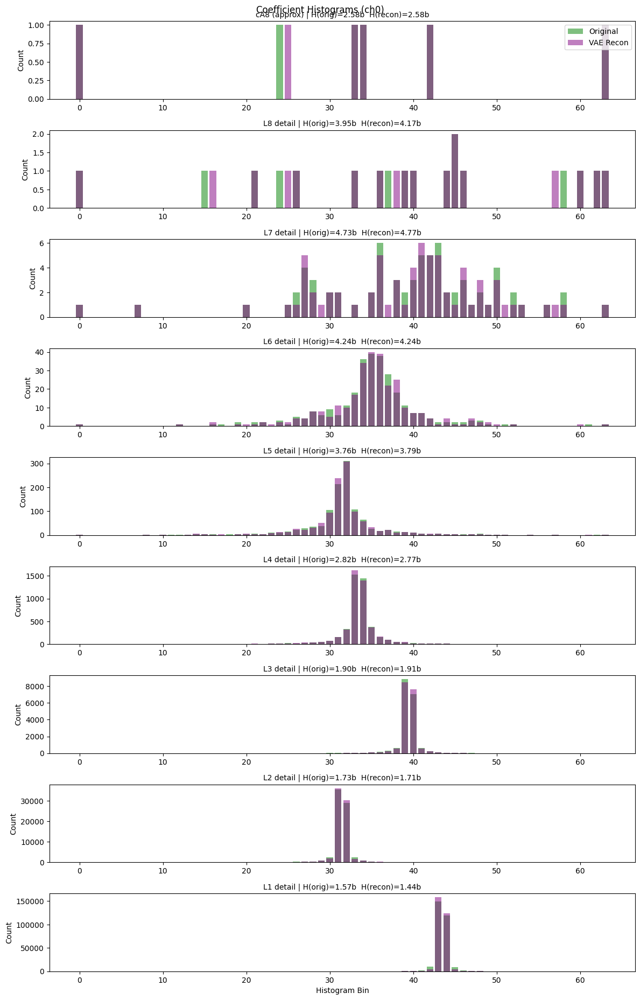

In [30]:
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------
# Stacked histogram visualization
# ---------------------------

def plot_coefficient_histograms(orig_coeffs_list, recon_coeffs_list, levels: int, channel_label: str = 'ch0', num_bins: int = 64):
    """Overlay orig vs recon coefficient histograms per level."""
    rows = levels + 1
    fig, axes = plt.subplots(rows, 1, figsize=(12, 2.1 * rows), sharex=False)
    if rows == 1:
        axes = [axes]

    for row_idx in range(rows):
        ax = axes[row_idx]
        if row_idx == 0:
            o = orig_coeffs_list[0].ravel()
            r = recon_coeffs_list[0].ravel()
            label = f'cA{levels} (approx)'
        else:
            cH_o, cV_o, cD_o = orig_coeffs_list[row_idx]
            cH_r, cV_r, cD_r = recon_coeffs_list[row_idx]
            o = np.concatenate([cH_o.ravel(), cV_o.ravel(), cD_o.ravel()])
            r = np.concatenate([cH_r.ravel(), cV_r.ravel(), cD_r.ravel()])
            label = f'L{levels + 1 - row_idx} detail'

        # Shared bins for overlay
        min_val = min(float(o.min()), float(r.min()))
        max_val = max(float(o.max()), float(r.max()))
        if min_val == max_val:
            bin_edges = np.linspace(min_val - 1.0, max_val + 1.0, num_bins + 1)
        else:
            bin_edges = np.linspace(min_val, max_val, num_bins + 1)

        o_bins, _ = np.histogram(o, bins=bin_edges)
        r_bins, _ = np.histogram(r, bins=bin_edges)

        o_stats = calculate_band_entropy(o, num_bins=num_bins)
        r_stats = calculate_band_entropy(r, num_bins=num_bins)

        ax.bar(range(num_bins), o_bins, alpha=0.5, color='green', label='Original')
        ax.bar(range(num_bins), r_bins, alpha=0.5, color='purple', label='VAE Recon')
        ax.set_ylabel('Count')
        ax.set_title(
            f"{label} | H(orig)={o_stats['entropy']:.2f}b  H(recon)={r_stats['entropy']:.2f}b",
            fontsize=10,
        )
        if row_idx == 0:
            ax.legend(loc='upper right')

    axes[-1].set_xlabel('Histogram Bin')
    fig.suptitle(f'Coefficient Histograms ({channel_label})', fontsize=12)
    fig.tight_layout()
    plt.show()

# Example: plot channel 0
plot_coefficient_histograms(orig_coeffs[0], recon_coeffs[0], LEVELS, channel_label='ch0', num_bins=64)


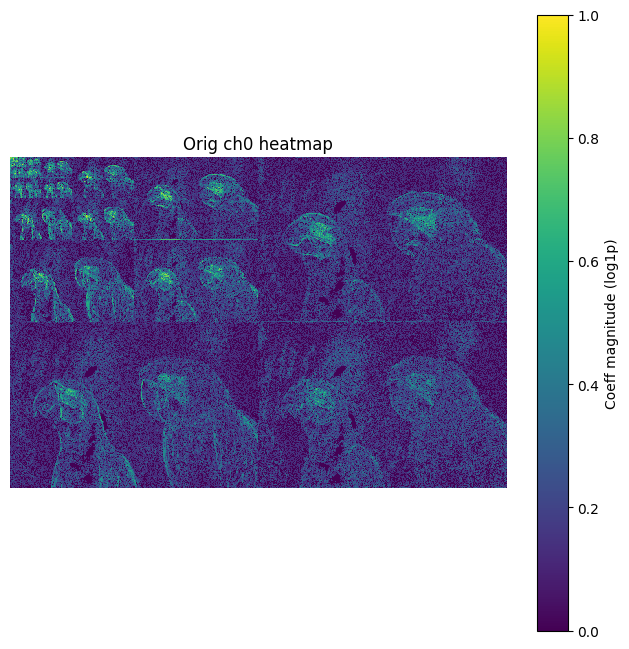

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------
# Coefficient heatmap (spatial layout)
# ---------------------------

def generate_coefficient_heatmap(coeffs_list, colormap: str = 'viridis', log_scale: bool = True, title: str = None):
    """Generate spatial heatmap for wavelet coefficients (LL top-left, details in quadrants)."""
    levels = len(coeffs_list) - 1

    # Start from deepest approximation
    block = np.abs(coeffs_list[0].astype(np.float64))

    # Iteratively expand with detail bands
    for lvl_idx in range(1, levels + 1):
        cH, cV, cD = coeffs_list[lvl_idx]
        cH = np.abs(cH.astype(np.float64))
        cV = np.abs(cV.astype(np.float64))
        cD = np.abs(cD.astype(np.float64))

        # Align shapes (safe for odd sizes)
        h = min(block.shape[0], cH.shape[0], cV.shape[0], cD.shape[0])
        w = min(block.shape[1], cH.shape[1], cV.shape[1], cD.shape[1])
        block = block[:h, :w]
        cH = cH[:h, :w]
        cV = cV[:h, :w]
        cD = cD[:h, :w]

        top = np.concatenate([block, cH], axis=1)
        bottom = np.concatenate([cV, cD], axis=1)
        block = np.concatenate([top, bottom], axis=0)

    heatmap = np.log1p(block) if log_scale else block
    if heatmap.max() > 0:
        heatmap = heatmap / heatmap.max()

    plt.figure(figsize=(8, 8))
    plt.imshow(heatmap, cmap=colormap, interpolation='nearest')
    plt.colorbar(label='Coeff magnitude (log1p)' if log_scale else 'Coeff magnitude')
    plt.axis('off')
    plt.title(title or 'Wavelet Coefficient Heatmap')
    plt.show()

# Example: channel 0
generate_coefficient_heatmap(orig_coeffs[0], colormap='viridis', log_scale=True, title='Orig ch0 heatmap')


In [32]:
import numpy as np
import pandas as pd

# ---------------------------
# Quantization requirements per band
# ---------------------------

def analyze_quantization_requirements(coeffs_list, levels: int, target_quality: str = 'visually_lossless') -> pd.DataFrame:
    df = analyze_wavelet_decomposition(coeffs_list, levels)

    df['theoretical_bits'] = df['entropy']
    if target_quality == 'visually_lossless':
        df['recommended_bits'] = np.ceil(df['entropy'] + 2.5).astype(int)
    else:
        df['recommended_bits'] = np.ceil(df['entropy']).astype(int)

    df['current_bits'] = 16
    df['waste_ratio'] = df['current_bits'] / df['theoretical_bits'].replace(0, np.nan)

    # Total size estimates
    total_coeffs = int(df['count'].sum())
    current_bits_total = total_coeffs * 16
    theoretical_bits_total = float((df['theoretical_bits'] * df['count']).sum())

    print('Quantization Analysis (per band):')
    print(df[['level', 'band', 'entropy', 'theoretical_bits', 'recommended_bits', 'current_bits', 'waste_ratio']])

    print('Total coefficients:', f'{total_coeffs:,}')
    print(f"Current storage: {current_bits_total / 8 / 1024:.2f} KB (16-bit)")
    print(f"Theoretical minimum: {theoretical_bits_total / 8 / 1024:.2f} KB (entropy coding)")
    if theoretical_bits_total > 0:
        print(f"Compression potential: {current_bits_total / theoretical_bits_total:.1f}x")

    return df

# Example: channel 0
_ = analyze_quantization_requirements(orig_coeffs[0], LEVELS, target_quality='visually_lossless')


Quantization Analysis (per band):
  level    band   entropy  theoretical_bits  recommended_bits  current_bits  \
0   cA8  approx  2.584963          2.584963                 6            16   
1    L8  detail  3.947703          3.947703                 7            16   
2    L7  detail  4.733813          4.733813                 8            16   
3    L6  detail  4.242057          4.242057                 7            16   
4    L5  detail  3.755798          3.755798                 7            16   
5    L4  detail  2.824327          2.824327                 6            16   
6    L3  detail  1.903571          1.903571                 5            16   
7    L2  detail  1.732674          1.732674                 5            16   
8    L1  detail  1.569677          1.569677                 5            16   

   waste_ratio  
0     6.189645  
1     4.052990  
2     3.379939  
3     3.771755  
4     4.260080  
5     5.665066  
6     8.405253  
7     9.234282  
8    10.193178  
Total

In [33]:
import numpy as np

# ---------------------------
# Hadamard + Wavelet pipeline
# ---------------------------

def hadamard_wavelet_pipeline(
    latent: np.ndarray,  # (4, H, W) or (1, 4, H, W)
    wavelet_levels: int = 3,
    per_channel_amplitudes: dict = None,
    normalize: bool = True,
) -> dict:
    """Hadamard forward -> per-channel wavelet -> amplitude control -> inverse."""
    if latent.ndim == 4:
        latent = latent.squeeze(0)
    if latent.shape[0] != 4:
        raise ValueError(f'Expected 4 channels, got {latent.shape}')

    # Step 1: Hadamard forward
    Y, U, V, W = hadamard_4ch_forward(latent, normalize=normalize)
    yuvw = [Y, U, V, W]
    channel_names = ['Y', 'U', 'V', 'W']

    wavelet_coeffs = {}
    modified_yuvw = []

    # Step 2-3: Wavelet + amplitude control per channel
    for name, ch in zip(channel_names, yuvw):
        ch_int = np.round(ch).astype(np.int32)
        coeffs = wavedec2_int(ch_int, wavelet_levels)
        wavelet_coeffs[name] = coeffs

        modified = [coeffs[0]]
        for lvl_idx in range(1, len(coeffs)):
            cH, cV, cD = coeffs[lvl_idx]
            amp = 1.0
            if per_channel_amplitudes is not None:
                amp = float(per_channel_amplitudes.get((name, lvl_idx), 1.0))
            modified.append((cH * amp, cV * amp, cD * amp))

        # Reconstruct per channel
        mod_int = [np.round(modified[0]).astype(np.int32)]
        for lvl_idx in range(1, len(modified)):
            mod_int.append(tuple(np.round(s).astype(np.int32) for s in modified[lvl_idx]))
        rec = waverec2_int(mod_int)
        modified_yuvw.append(rec.astype(np.float64))

    # Step 4: Hadamard inverse
    reconstructed_latent = hadamard_4ch_inverse(
        modified_yuvw[0], modified_yuvw[1], modified_yuvw[2], modified_yuvw[3],
        normalized=normalize, clip_output=False
    )

    return {
        'YUVW': yuvw,
        'wavelet_coeffs': wavelet_coeffs,
        'modified_YUVW': modified_yuvw,
        'reconstructed_latent': reconstructed_latent,
    }

# Example: run on quantized latent
example_latent = compressed.quantized_latent.squeeze(0)
pipe = hadamard_wavelet_pipeline(example_latent, wavelet_levels=3, per_channel_amplitudes=None)
print('Pipeline output keys:', list(pipe.keys()))


Pipeline output keys: ['YUVW', 'wavelet_coeffs', 'modified_YUVW', 'reconstructed_latent']


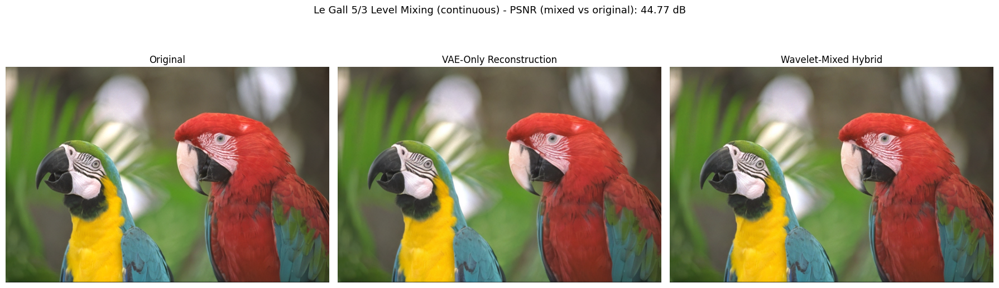

Level mix ratios:
  [0] cA8 (approx)           -> recon mix 1.00
  [1] Level 8 detail         -> recon mix 1.00
  [2] Level 7 detail         -> recon mix 1.00
  [3] Level 6 detail         -> recon mix 1.00
  [4] Level 5 detail         -> recon mix 1.00
  [5] Level 4 detail         -> recon mix 0.00
  [6] Level 3 detail         -> recon mix 0.00
  [7] Level 2 detail         -> recon mix 0.00
  [8] Level 1 detail         -> recon mix 0.00
PSNR (mixed vs original): 44.77 dB


In [34]:
# -- Cell: Wavelet Level Mixing & Reconstruction ---------------------------
import numpy as np
import matplotlib.pyplot as plt

# -- USER CONFIG -------------------------------------------------------------
# Continuous mix ratios per level (0.0 = original, 1.0 = recon).
# Index 0 = cA8 approximation (lowest frequency)
# Index 1 = Level 8 detail
# ...
# Index 8 = Level 1 detail (highest frequency)

mix_ratios = [
    1.0,  # 0: cA8  approximation
    1.0,  # 1: level 8 detail
    1.0,  # 2: level 7 detail
    1.0,  # 3: level 6 detail
    1.0,  # 4: level 5 detail
    0.0,  # 5: level 4 detail
    0.0,  # 6: level 3 detail
    0.0,  # 7: level 2 detail
    0.0,  # 8: level 1 detail
]
# ---------------------------------------------------------------------------

def mix_wavelet_levels(orig_coeffs_list, recon_coeffs_list, mix_ratios_list):
    """Continuous mix of wavelet coefficients per level."""
    if len(orig_coeffs_list) != len(recon_coeffs_list):
        raise ValueError('orig/recon coeff length mismatch')
    if len(mix_ratios_list) != len(orig_coeffs_list):
        raise ValueError('mix_ratios length must match levels + 1')

    mixed = []

    # Approximation
    m0 = float(np.clip(mix_ratios_list[0], 0.0, 1.0))
    mixed_cA = (1.0 - m0) * orig_coeffs_list[0] + m0 * recon_coeffs_list[0]
    mixed.append(mixed_cA)

    # Detail levels
    for lvl_idx in range(1, len(orig_coeffs_list)):
        cH_o, cV_o, cD_o = orig_coeffs_list[lvl_idx]
        cH_r, cV_r, cD_r = recon_coeffs_list[lvl_idx]
        m = float(np.clip(mix_ratios_list[lvl_idx], 0.0, 1.0))
        mixed.append((
            (1.0 - m) * cH_o + m * cH_r,
            (1.0 - m) * cV_o + m * cV_r,
            (1.0 - m) * cD_o + m * cD_r,
        ))

    return mixed

# Build mixed coefficients per channel
mixed_rgb = np.zeros_like(orig_rgb, dtype=np.float64)

for ch in range(3):
    mixed = mix_wavelet_levels(orig_coeffs[ch], recon_coeffs[ch], mix_ratios)

    # Round back to int for integer lifting inverse
    mixed_int = [np.round(mixed[0]).astype(np.int32)]
    for i in range(1, len(mixed)):
        mixed_int.append(tuple(np.round(s).astype(np.int32) for s in mixed[i]))

    rec = waverec2_int(mixed_int)
    mixed_rgb[:, :, ch] = rec

mixed_rgb_u8 = np.clip(mixed_rgb, 0, 255).astype(np.uint8)

# -- PSNR -------------------------------------------------------------------
mse = np.mean((orig_rgb.astype(np.float64) - mixed_rgb) ** 2)
psnr = 10 * np.log10(255.0**2 / mse) if mse > 0 else float('inf')

# -- Display ----------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(orig_rgb);           axes[0].set_title('Original')
axes[1].imshow(recon_rgb);          axes[1].set_title('VAE-Only Reconstruction')
axes[2].imshow(mixed_rgb_u8);       axes[2].set_title('Wavelet-Mixed Hybrid')
for ax in axes:
    ax.axis('off')
fig.suptitle(
    f'Le Gall 5/3 Level Mixing (continuous) - PSNR (mixed vs original): {psnr:.2f} dB',
    fontsize=13,
)
fig.tight_layout()
plt.show()

# -- Summary ----------------------------------------------------------------
print('Level mix ratios:')
level_labels = [f'cA{LEVELS} (approx)'] + [f'Level {LEVELS + 1 - i} detail' for i in range(1, LEVELS + 1)]
for i, (lbl, m) in enumerate(zip(level_labels, mix_ratios)):
    print(f'  [{i}] {lbl:<22} -> recon mix {m:.2f}')
print(f'PSNR (mixed vs original): {psnr:.2f} dB')


Analysing top 4 detail levels (wavelet levels 4…1, coeff indices [5, 6, 7, 8])

Coefficients to store : 1,175,040
Original image pixels : 1,179,648  (RGB)
Ratio                 : 99.61% of image size

                             Energy        Std    Max |v|
Full coeffs              57,022,355       6.96     370.00
Residual coeffs          25,288,110       4.64     159.00

Residual / Full energy : 0.4435  (44.3%)
Theoretical bit saving : ~0.59 bits/coeff

bits |  Full zlib | Resid zlib |  Saving | Full PSNR | Resid PSNR
-----------------------------------------------------------------
   4 |    172,451 |    185,522 |   -7.6% |     19.38 |      26.93
   5 |    183,594 |    210,240 |  -14.5% |     26.12 |      34.42
   6 |    206,853 |    278,573 |  -34.7% |     32.70 |      38.72
   7 |    267,132 |    411,396 |  -54.0% |     38.47 |      42.50
   8 |    384,222 |    561,210 |  -46.1% |     42.62 |      43.45
  10 |    727,896 |    756,649 |   -4.0% |     44.78 |      44.78


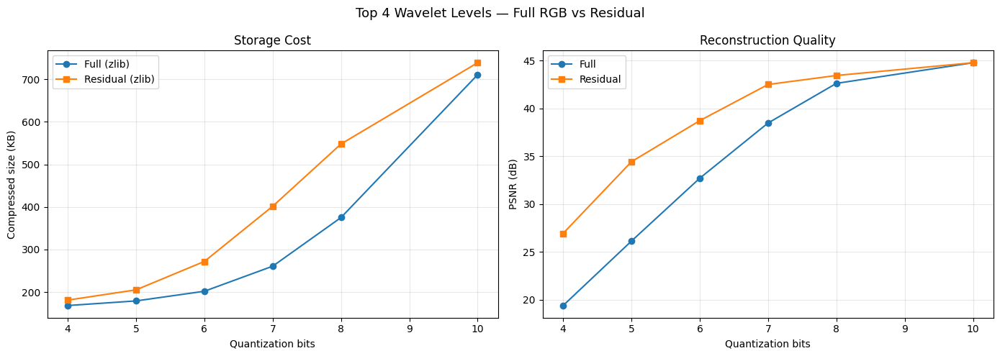

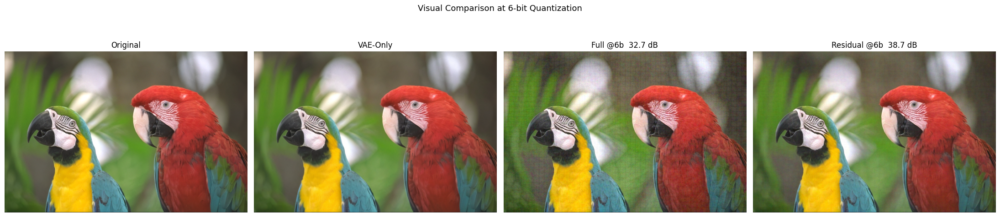

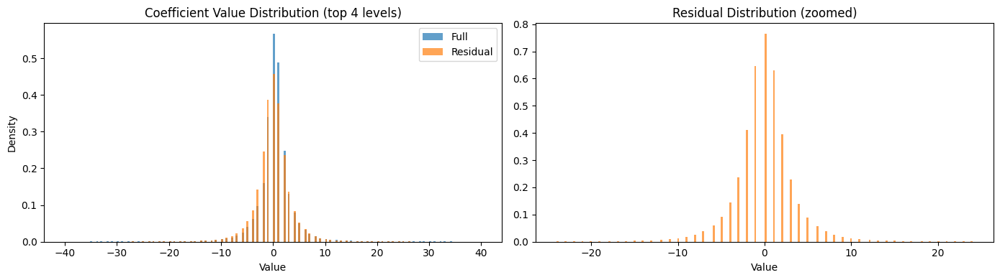


VAE-only PSNR : 33.20 dB
Residual saves  : -54%--4% vs full across 4-10 bits

Verdict: store RESIDUAL wavelet coefficients for the top 4 levels.
At decode time: VAE decode -> wavedec2_int -> add residual -> waverec2_int.


In [35]:
# ── Cell: Residual vs Full Wavelet Storage Analysis (Top 4 Levels) ──────────
import numpy as np
import matplotlib.pyplot as plt
import zlib

TOP_N = 4  # number of highest-frequency detail levels to store
# Coefficient list indices for top N levels:
#   index 5 = level 4 detail, 6 = level 3, 7 = level 2, 8 = level 1 (finest)
TOP_INDICES = list(range(LEVELS + 1 - TOP_N, LEVELS + 1))

print(f"Analysing top {TOP_N} detail levels (wavelet levels {TOP_N}…1, coeff indices {TOP_INDICES})")
print("=" * 70)

# ── 1) Gather per-piece arrays (full vs residual) and layout metadata ──
pieces_full, pieces_resid, piece_meta = [], [], []
for ch in range(3):
    for idx in TOP_INDICES:
        for sb, (o, r) in enumerate(zip(orig_coeffs[ch][idx], recon_coeffs[ch][idx])):
            pieces_full.append(o.ravel().astype(np.float64))
            pieces_resid.append((o.astype(np.float64) - r.astype(np.float64)).ravel())
            piece_meta.append((ch, idx, sb, o.shape))

full_all  = np.concatenate(pieces_full)
resid_all = np.concatenate(pieces_resid)

n_coeffs  = len(full_all)
img_pixels = orig_rgb.shape[0] * orig_rgb.shape[1] * 3
print(f"\nCoefficients to store : {n_coeffs:,}")
print(f"Original image pixels : {img_pixels:,}  (RGB)")
print(f"Ratio                 : {n_coeffs / img_pixels:.2%} of image size\n")

# ── 2) Energy comparison ──
e_full  = np.sum(full_all ** 2)
e_resid = np.sum(resid_all ** 2)

print(f"{'':>20} {'Energy':>14} {'Std':>10} {'Max |v|':>10}")
print(f"{'Full coeffs':<20} {e_full:>14,.0f} {np.std(full_all):>10.2f} {np.max(np.abs(full_all)):>10.2f}")
print(f"{'Residual coeffs':<20} {e_resid:>14,.0f} {np.std(resid_all):>10.2f} {np.max(np.abs(resid_all)):>10.2f}")
ratio = e_resid / e_full
print(f"\nResidual / Full energy : {ratio:.4f}  ({ratio * 100:.1f}%)")
print(f"Theoretical bit saving : ~{np.log2(1 / ratio) / 2:.2f} bits/coeff\n")

# ── 3) Helpers ──
def quantize(arr, bits):
    clip = np.max(np.abs(arr)) * 1.001
    levels = (1 << bits) - 1
    q = np.round((arr + clip) / (2 * clip) * levels).astype(np.int32)
    return q, clip, levels

def dequantize(q, clip, levels):
    return q.astype(np.float64) / levels * (2 * clip) - clip

def zlib_size(q, bits):
    dtype = np.uint8 if bits <= 8 else np.uint16
    return len(zlib.compress(q.astype(dtype).tobytes(), 9))

def rebuild_image(dq_flat, is_residual):
    """Reconstruct full RGB image from (de)quantized top-N level data."""
    # Deep-copy recon coefficients as the base
    mixed = []
    for ch in range(3):
        ch_c = [recon_coeffs[ch][0].copy()]
        for i in range(1, LEVELS + 1):
            ch_c.append(tuple(s.copy() for s in recon_coeffs[ch][i]))
        mixed.append(ch_c)

    # Overlay stored pieces
    ptr = 0
    for ch, idx, sb, shape in piece_meta:
        n = shape[0] * shape[1]
        vals = dq_flat[ptr : ptr + n].reshape(shape)
        ptr += n
        subs = list(mixed[ch][idx])
        if is_residual:
            subs[sb] = (recon_coeffs[ch][idx][sb].astype(np.float64) + vals)
        else:
            subs[sb] = vals
        mixed[ch][idx] = tuple(subs)

    # Round to int32 for integer lifting inverse
    img = np.zeros_like(orig_rgb, dtype=np.float64)
    for ch in range(3):
        int_coeffs = [np.round(mixed[ch][0]).astype(np.int32)]
        for i in range(1, LEVELS + 1):
            int_coeffs.append(tuple(np.round(s).astype(np.int32)
                                    for s in mixed[ch][i]))
        rec = waverec2_int(int_coeffs)
        img[:, :, ch] = rec
    return np.clip(img, 0, 255).astype(np.uint8)

def psnr_of(img):
    mse = np.mean((orig_rgb.astype(np.float64) - img.astype(np.float64)) ** 2)
    return 10 * np.log10(255.0 ** 2 / mse) if mse > 0 else float("inf")

# ── 4) Sweep bit depths ──
bit_depths = [4, 5, 6, 7, 8, 10]
rows = []

hdr = (f"{'bits':>4} | {'Full zlib':>10} | {'Resid zlib':>10} "
       f"| {'Saving':>7} | {'Full PSNR':>9} | {'Resid PSNR':>10}")
print(hdr)
print("-" * len(hdr))

for bits in bit_depths:
    q_f, cl_f, lv_f = quantize(full_all, bits)
    q_r, cl_r, lv_r = quantize(resid_all, bits)

    sz_f = zlib_size(q_f, bits)
    sz_r = zlib_size(q_r, bits)
    saving = (1 - sz_r / sz_f) * 100

    img_f = rebuild_image(dequantize(q_f, cl_f, lv_f), is_residual=False)
    img_r = rebuild_image(dequantize(q_r, cl_r, lv_r), is_residual=True)
    p_f, p_r = psnr_of(img_f), psnr_of(img_r)

    rows.append(dict(bits=bits, sz_f=sz_f, sz_r=sz_r, saving=saving,
                     psnr_f=p_f, psnr_r=p_r, img_f=img_f, img_r=img_r))
    print(f"{bits:>4} | {sz_f:>10,} | {sz_r:>10,} "
          f"| {saving:>6.1f}% | {p_f:>9.2f} | {p_r:>10.2f}")

# ── 5) Size & quality plots ──
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

blist = [r["bits"] for r in rows]
ax1.plot(blist, [r["sz_f"] / 1024 for r in rows], "o-", label="Full (zlib)")
ax1.plot(blist, [r["sz_r"] / 1024 for r in rows], "s-", label="Residual (zlib)")
ax1.set_xlabel("Quantization bits")
ax1.set_ylabel("Compressed size (KB)")
ax1.set_title("Storage Cost")
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(blist, [r["psnr_f"] for r in rows], "o-", label="Full")
ax2.plot(blist, [r["psnr_r"] for r in rows], "s-", label="Residual")
ax2.set_xlabel("Quantization bits")
ax2.set_ylabel("PSNR (dB)")
ax2.set_title("Reconstruction Quality")
ax2.legend()
ax2.grid(True, alpha=0.3)

fig.suptitle(f"Top {TOP_N} Wavelet Levels — Full RGB vs Residual", fontsize=13)
fig.tight_layout()
plt.show()

# ── 6) Visual comparison at 6-bit quantization ──
r6 = next(r for r in rows if r["bits"] == 6)

fig, axes = plt.subplots(1, 4, figsize=(22, 5.5))
for ax, img, title in zip(axes,
        [orig_rgb, recon_rgb, r6["img_f"], r6["img_r"]],
        ["Original", "VAE-Only",
         f"Full @6b  {r6['psnr_f']:.1f} dB",
         f"Residual @6b  {r6['psnr_r']:.1f} dB"]):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis("off")
fig.suptitle("Visual Comparison at 6-bit Quantization", fontsize=13)
fig.tight_layout()
plt.show()

# ── 7) Coefficient distribution ──
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))
clip_vis = np.percentile(np.abs(full_all), 99.5)
ax1.hist(full_all, bins=200, density=True, alpha=0.7,
         range=(-clip_vis, clip_vis), label="Full")
ax1.hist(resid_all, bins=200, density=True, alpha=0.7,
         range=(-clip_vis, clip_vis), label="Residual")
ax1.set_title("Coefficient Value Distribution (top 4 levels)")
ax1.set_xlabel("Value")
ax1.set_ylabel("Density")
ax1.legend()

clip_r = np.percentile(np.abs(resid_all), 99.5)
ax2.hist(resid_all, bins=200, density=True, alpha=0.7, color="C1",
         range=(-clip_r, clip_r))
ax2.set_title("Residual Distribution (zoomed)")
ax2.set_xlabel("Value")
fig.tight_layout()
plt.show()

# ── 8) Summary ──
vae_psnr = psnr_of(recon_rgb)
print(f"\n{'=' * 70}")
print(f"VAE-only PSNR : {vae_psnr:.2f} dB")
savings = [r["saving"] for r in rows]
print(f"Residual saves  : {min(savings):.0f}%-{max(savings):.0f}% vs full across {bit_depths[0]}-{bit_depths[-1]} bits")
print(f"\nVerdict: store RESIDUAL wavelet coefficients for the top {TOP_N} levels.")
print(f"At decode time: VAE decode -> wavedec2_int -> add residual -> waverec2_int.")

## Entropy Coding with constriction (ANS)


In [36]:
import io
import struct
import numpy as np

# NOTE: if this fails, install with: pip install constriction~=0.4.2
try:
    import constriction
except ImportError as e:
    raise ImportError('Missing constriction. Run: pip install constriction~=0.4.2') from e

# ---------------------------
# Band helpers
# ---------------------------

def collect_wavelet_bands(coeffs_list, levels, prefix='ch0'):
    bands = [(f'{prefix}_cA{levels}', coeffs_list[0], 0)]
    for lvl_idx in range(1, levels + 1):
        level = levels + 1 - lvl_idx
        cH, cV, cD = coeffs_list[lvl_idx]
        bands.append((f'{prefix}_L{level}_LH', cH, lvl_idx))
        bands.append((f'{prefix}_L{level}_HL', cV, lvl_idx))
        bands.append((f'{prefix}_L{level}_HH', cD, lvl_idx))
    return bands


def collect_all_bands(coeffs_by_channel, levels):
    bands = []
    for ch in range(len(coeffs_by_channel)):
        bands.extend(collect_wavelet_bands(coeffs_by_channel[ch], levels, prefix=f'ch{ch}'))
    return bands


def bands_to_coeffs(band_arrays, levels):
    idx = 0
    cA = band_arrays[idx]
    idx += 1
    coeffs = [cA]
    for _ in range(1, levels + 1):
        cH = band_arrays[idx]
        cV = band_arrays[idx + 1]
        cD = band_arrays[idx + 2]
        coeffs.append((cH, cV, cD))
        idx += 3
    return coeffs


def split_bands_to_channels(bands, levels, num_channels=3):
    per_ch = 1 + 3 * levels
    out = []
    idx = 0
    for _ in range(num_channels):
        ch_bands = bands[idx: idx + per_ch]
        arrays = [b[1] if isinstance(b, tuple) else b for b in ch_bands]
        out.append(bands_to_coeffs(arrays, levels))
        idx += per_ch
    return out

# ---------------------------
# Quantization
# ---------------------------

def quantize_uniform(arr, bits, clip=None, clip_percentile=99.5):
    arr = arr.astype(np.float64)
    if clip is None:
        clip = float(np.percentile(np.abs(arr), clip_percentile))
    if clip <= 0:
        levels = 1 << bits
        q = np.zeros_like(arr, dtype=np.int32)
        return q, 1.0, levels
    levels = 1 << bits
    q = np.rint((arr + clip) / (2 * clip) * (levels - 1)).astype(np.int32)
    q = np.clip(q, 0, levels - 1)
    return q, clip, levels


def dequantize_uniform(q, clip, levels):
    if levels <= 1:
        return np.zeros_like(q, dtype=np.float64)
    return (q.astype(np.float64) / (levels - 1)) * (2 * clip) - clip

# ---------------------------
# Entropy coding
# ---------------------------

def entropy_encode_bands(bands, bits_per_level, clip_percentile=99.5, smooth=1.0, threshold=0.0):
    coder = constriction.stream.stack.AnsCoder()
    meta = []

    for name, arr, lvl_idx in reversed(bands):
        bits = int(bits_per_level[lvl_idx])
        arr_f = arr.astype(np.float64)
        if threshold > 0:
            arr_f[np.abs(arr_f) < threshold] = 0.0

        q, clip, levels = quantize_uniform(arr_f, bits, clip_percentile=clip_percentile)
        counts = np.bincount(q.ravel(), minlength=levels).astype(np.uint32)
        probs = (counts.astype(np.float64) + smooth)
        probs = probs / probs.sum()

        model = constriction.stream.model.Categorical(probs.astype(np.float32), perfect=False)
        coder.encode_reverse(q.ravel().astype(np.int32), model)

        meta.append({
            'name': name,
            'shape': arr.shape,
            'lvl_idx': int(lvl_idx),
            'bits': bits,
            'levels': int(levels),
            'clip': float(clip),
            'counts': counts,
            'smooth': float(smooth),
        })

    meta.reverse()
    compressed = coder.get_compressed()
    bits_used = int(coder.num_valid_bits())
    return compressed, bits_used, meta


def entropy_decode_bands(compressed, meta):
    coder = constriction.stream.stack.AnsCoder(compressed)
    decoded = []
    for m in meta:
        counts = m['counts'].astype(np.float64)
        probs = counts + m['smooth']
        probs = probs / probs.sum()
        model = constriction.stream.model.Categorical(probs.astype(np.float32), perfect=False)

        num = int(np.prod(m['shape']))
        q = coder.decode(model, num).reshape(m['shape'])
        arr = dequantize_uniform(q, m['clip'], m['levels'])
        decoded.append((m['name'], arr, m['lvl_idx']))

    if not coder.is_empty():
        print('Warning: decoder not empty (extra bits remain).')
    return decoded

# ---------------------------
# Simple container format
# ---------------------------

def pack_entropy_payload(meta, compressed):
    buf = io.BytesIO()
    buf.write(b'EWAV')
    buf.write(struct.pack('<I', len(meta)))
    for m in meta:
        name_bytes = m['name'].encode('ascii', 'ignore')
        buf.write(struct.pack('<I', len(name_bytes)))
        buf.write(name_bytes)
        h, w = m['shape']
        buf.write(struct.pack('<II', int(h), int(w)))
        buf.write(struct.pack('<I', int(m['lvl_idx'])))
        buf.write(struct.pack('<I', int(m['bits'])))
        buf.write(struct.pack('<I', int(m['levels'])))
        buf.write(struct.pack('<f', float(m['clip'])))
        counts = m['counts'].astype(np.uint32)
        buf.write(struct.pack('<I', int(counts.size)))
        buf.write(counts.tobytes(order='C'))

    comp = np.asarray(compressed, dtype=np.uint32)
    buf.write(struct.pack('<I', int(comp.size)))
    buf.write(comp.tobytes(order='C'))
    return buf.getvalue()

# ---------------------------
# Bit allocation helper
# ---------------------------

def recommended_bits_per_level(coeffs_by_channel, levels, extra_bits=2.5, min_bits=2, max_bits=12):
    ent = np.zeros(levels + 1, dtype=np.float64)
    for ch in range(len(coeffs_by_channel)):
        df = analyze_wavelet_decomposition(coeffs_by_channel[ch], levels)
        ent += df['entropy'].values
    ent /= len(coeffs_by_channel)

    bits = np.ceil(ent + extra_bits).astype(np.int32)
    bits = np.clip(bits, min_bits, max_bits)
    return bits.tolist()


def rebuild_rgb_from_coeffs(coeffs_by_channel):
    rec = np.zeros_like(orig_rgb, dtype=np.float64)
    for ch in range(3):
        coeffs = coeffs_by_channel[ch]
        coeffs_int = [np.round(coeffs[0]).astype(np.int32)]
        for i in range(1, len(coeffs)):
            coeffs_int.append(tuple(np.round(s).astype(np.int32) for s in coeffs[i]))
        rec[:, :, ch] = waverec2_int(coeffs_int)
    return np.clip(rec, 0, 255).astype(np.uint8)


In [37]:
# ---------------------------
# Run entropy coding experiment
# ---------------------------

bits_per_level = recommended_bits_per_level(orig_coeffs, LEVELS, extra_bits=2.5)
print('bits_per_level:', bits_per_level)

clip_percentile = 99.5
threshold = 0.0
smooth = 1.0

bands = collect_all_bands(orig_coeffs, LEVELS)
compressed, bits_used, meta = entropy_encode_bands(
    bands,
    bits_per_level,
    clip_percentile=clip_percentile,
    smooth=smooth,
    threshold=threshold,
)

payload = pack_entropy_payload(meta, compressed)
size_kb = len(payload) / 1024.0
print(f'ANS bits used (payload only): {bits_used:,} bits')
print(f'Packed payload size: {size_kb:.2f} KB')

# Decode + reconstruct
decoded_bands = entropy_decode_bands(compressed, meta)
coeffs_by_channel = split_bands_to_channels(decoded_bands, LEVELS, num_channels=3)
rec_rgb_u8 = rebuild_rgb_from_coeffs(coeffs_by_channel)
psnr_val = psnr_uint8(orig_rgb, rec_rgb_u8)
print(f'PSNR (entropy-coded full coeffs): {psnr_val:.2f} dB')

# ---------------------------
# Threshold sweep (size vs PSNR)
# ---------------------------
thresholds = [0, 1, 2, 4, 8, 16, 32]
rows = []
for t in thresholds:
    compressed, bits_used, meta = entropy_encode_bands(
        bands,
        bits_per_level,
        clip_percentile=clip_percentile,
        smooth=smooth,
        threshold=float(t),
    )
    payload = pack_entropy_payload(meta, compressed)
    decoded_bands = entropy_decode_bands(compressed, meta)
    coeffs_by_channel = split_bands_to_channels(decoded_bands, LEVELS, num_channels=3)
    rec_rgb_u8 = rebuild_rgb_from_coeffs(coeffs_by_channel)
    psnr_val = psnr_uint8(orig_rgb, rec_rgb_u8)
    rows.append((t, len(payload) / 1024.0, psnr_val))
    print(f'threshold={t:>3} | size={rows[-1][1]:>8.2f} KB | PSNR={psnr_val:>6.2f} dB')


bits_per_level: [6, 7, 8, 7, 7, 6, 5, 5, 5]
ANS bits used (payload only): 3,097,286 bits
Packed payload size: 409.97 KB
PSNR (entropy-coded full coeffs): 34.74 dB
threshold=  0 | size=  409.97 KB | PSNR= 34.74 dB
threshold=  1 | size=  409.97 KB | PSNR= 34.74 dB
threshold=  2 | size=  342.79 KB | PSNR= 34.55 dB
threshold=  4 | size=  226.95 KB | PSNR= 33.97 dB
threshold=  8 | size=  112.76 KB | PSNR= 32.24 dB
threshold= 16 | size=   64.16 KB | PSNR= 28.64 dB
threshold= 32 | size=   43.99 KB | PSNR= 23.07 dB


## ANS Size Comparisons (Residual vs Wavelet + Hadamard Latent)

This section compares ANS sizes using the SAME `compressed` objects from the NPZ blur experiments.Note: Hadamard uses the 4-channel latent (uint8) and is **not** applied to RGB residuals.


In [38]:
import io
import struct
import numpy as np

# NOTE: if this fails, install with: pip install constriction~=0.4.2
try:
    import constriction
except ImportError as e:
    raise ImportError('Missing constriction. Run: pip install constriction~=0.4.2') from e

# ---------------------------
# ANS lossless helpers (integer arrays)
# ---------------------------

def ans_encode_named_arrays(arrays, smooth: float = 1.0):
    """Lossless ANS encode a list of (name, ndarray) integer arrays."""
    coder = constriction.stream.stack.AnsCoder()
    meta = []

    for name, arr in reversed(arrays):
        arr_i = arr.astype(np.int32)
        min_val = int(arr_i.min())
        max_val = int(arr_i.max())
        levels = int(max_val - min_val + 1)

        symbols = (arr_i - min_val).astype(np.int32)
        counts = np.bincount(symbols.ravel(), minlength=levels).astype(np.uint32)

        probs = counts.astype(np.float64) + smooth
        probs = probs / probs.sum()
        model = constriction.stream.model.Categorical(probs.astype(np.float32), perfect=False)

        coder.encode_reverse(symbols.ravel().astype(np.int32), model)

        meta.append({
            'name': name,
            'shape': arr_i.shape,
            'min': min_val,
            'max': max_val,
            'levels': levels,
            'counts': counts,
            'smooth': float(smooth),
        })

    meta.reverse()
    compressed = coder.get_compressed()
    bits_used = int(coder.num_valid_bits())
    return compressed, bits_used, meta


def pack_ans_payload(meta, compressed):
    """Pack meta + compressed ANS stream into a byte payload for size accounting."""
    buf = io.BytesIO()
    buf.write(b'ANSL')
    buf.write(struct.pack('<I', len(meta)))
    for m in meta:
        name_bytes = m['name'].encode('ascii', 'ignore')
        buf.write(struct.pack('<I', len(name_bytes)))
        buf.write(name_bytes)
        shape = m['shape']
        if len(shape) != 2:
            raise ValueError('Expected 2D arrays')
        h, w = shape
        buf.write(struct.pack('<II', int(h), int(w)))
        buf.write(struct.pack('<i', int(m['min'])))
        buf.write(struct.pack('<i', int(m['max'])))
        buf.write(struct.pack('<I', int(m['levels'])))
        counts = m['counts'].astype(np.uint32)
        buf.write(struct.pack('<I', int(counts.size)))
        buf.write(counts.tobytes(order='C'))

    comp = np.asarray(compressed, dtype=np.uint32)
    buf.write(struct.pack('<I', int(comp.size)))
    buf.write(comp.tobytes(order='C'))
    return buf.getvalue()


def ans_size_kb(arrays, smooth: float = 1.0):
    compressed, bits_used, meta = ans_encode_named_arrays(arrays, smooth=smooth)
    payload = pack_ans_payload(meta, compressed)
    return len(payload) / 1024.0, bits_used

# ---------------------------
# Residual helpers
# ---------------------------

def wavelet_coeffs_from_residual(residual: np.ndarray, levels: int):
    """Compute wavedec2_int coeffs for each residual channel."""
    coeffs_by_ch = []
    for ch in range(3):
        coeffs_by_ch.append(wavedec2_int(residual[:, :, ch].astype(np.int32), levels))
    return coeffs_by_ch


def ans_size_wavelet_residual(residual: np.ndarray, levels: int, smooth: float = 1.0):
    coeffs_by_ch = wavelet_coeffs_from_residual(residual, levels)
    bands = collect_all_bands(coeffs_by_ch, levels)
    arrays = [(name, arr) for name, arr, _ in bands]
    return ans_size_kb(arrays, smooth=smooth)

# ---------------------------
# Latent helpers (Hadamard)
# ---------------------------

def ans_size_latent_pixel(latent_u8: np.ndarray, smooth: float = 1.0):
    arrays = [(f'latent_c{ch}', latent_u8[ch]) for ch in range(4)]
    return ans_size_kb(arrays, smooth=smooth)


def ans_size_latent_hadamard(latent_u8: np.ndarray, smooth: float = 1.0):
    Y, U, V, W = hadamard_4ch_forward(latent_u8, normalize=True)
    imgs = hadamard_4ch_to_image(Y, U, V, W, mode='yuv_w_alpha')
    rgba = imgs['rgba']  # (H, W, 4) uint8
    arrays = [
        ('had_y', rgba[:, :, 0]),
        ('had_u', rgba[:, :, 1]),
        ('had_v', rgba[:, :, 2]),
        ('had_w', rgba[:, :, 3]),
    ]
    return ans_size_kb(arrays, smooth=smooth)

# ---------------------------
# Run comparisons (requires `results` from NPZ experiments)
# ---------------------------

if 'results' not in globals():
    raise RuntimeError('Run the NPZ blur experiments cell first (results list not found).')

smooth = 1.0
rows = []

for exp in results:
    name = exp['experiment']
    compressed = exp['compressed_data']
    residual = compressed.residual
    latent_u8 = compressed.quantized_latent.squeeze(0).astype(np.uint8)

    # Baseline NPZ total size
    npz_total = sum(exp['sizes'].values()) / 1024.0

    # ANS sizes
    resid_pixel_kb, resid_pixel_bits = ans_size_kb([
        (f'{name}_r', residual[:, :, 0]),
        (f'{name}_g', residual[:, :, 1]),
        (f'{name}_b', residual[:, :, 2]),
    ], smooth=smooth)

    resid_wavelet_kb, resid_wavelet_bits = ans_size_wavelet_residual(residual, LEVELS, smooth=smooth)

    latent_pixel_kb, latent_pixel_bits = ans_size_latent_pixel(latent_u8, smooth=smooth)
    had_latent_kb, had_latent_bits = ans_size_latent_hadamard(latent_u8, smooth=smooth)

    rows.append({
        'experiment': name,
        'npz_kb': npz_total,
        'ans_resid_pixel_kb': resid_pixel_kb,
        'ans_resid_wavelet_kb': resid_wavelet_kb,
        'ans_latent_pixel_kb': latent_pixel_kb,
        'ans_latent_hadamard_kb': had_latent_kb,
        'bits_resid_pixel': resid_pixel_bits,
        'bits_resid_wavelet': resid_wavelet_bits,
        'bits_latent_pixel': latent_pixel_bits,
        'bits_latent_hadamard': had_latent_bits,
    })

# Display summary
import pandas as pd
summary = pd.DataFrame(rows)
cols = [
    'experiment',
    'npz_kb',
    'ans_resid_pixel_kb',
    'ans_resid_wavelet_kb',
    'ans_latent_pixel_kb',
    'ans_latent_hadamard_kb',
]
print(summary[cols].to_string(index=False))


 experiment     npz_kb  ans_resid_pixel_kb  ans_resid_wavelet_kb  ans_latent_pixel_kb  ans_latent_hadamard_kb
 NPZ NoBlur 752.436523          576.847656            535.086914            21.390625               17.570312
 NPZ Blur 1 539.171875          409.402344            543.547852            21.390625               17.570312
 NPZ Blur 3 372.707031          281.300781            538.743164            21.390625               17.570312
 NPZ Blur 5 272.355469          206.718750            500.458008            21.390625               17.570312
 NPZ Blur 7 210.006836          159.914062            461.750977            21.390625               17.570312
 NPZ Blur 9 164.878906          126.667969            410.782227            21.390625               17.570312
NPZ Blur 11 131.191406          102.073242            366.938477            21.390625               17.570312


## Residual Wavelet ANS (Per-band Quant + Threshold Sweep)

This section adds per-band quantization + thresholding for residual wavelet ANS and sweeps thresholds(plus tau from existing NPZ experiments) to hit a target PSNR.


In [39]:
import io
import struct
import numpy as np
import pandas as pd

# ---------------------------
# Safety checks
# ---------------------------
required = [
    'collect_all_bands', 'split_bands_to_channels',
    'wavedec2_int', 'waverec2_int',
    'ans_size_kb', 'ans_size_latent_hadamard',
    'analyze_wavelet_decomposition',
    'CompressedData', 'decompress_image',
]
for name in required:
    if name not in globals():
        raise RuntimeError(f'Missing required symbol: {name}')

if 'results' not in globals():
    raise RuntimeError('Run the NPZ blur experiments cell first (results list not found).')

# Fallback PSNR if not already defined
if 'psnr_uint8' not in globals():
    def psnr_uint8(a: np.ndarray, b: np.ndarray, data_range: float = 255.0) -> float:
        a = a.astype(np.float64)
        b = b.astype(np.float64)
        mse = np.mean((a - b) ** 2)
        if mse == 0:
            return float('inf')
        return 10.0 * np.log10((data_range ** 2) / mse)

# ---------------------------
# Wavelet helpers
# ---------------------------

def wavelet_coeffs_from_rgb(rgb: np.ndarray, levels: int):
    coeffs_by_ch = []
    for ch in range(3):
        coeffs_by_ch.append(wavedec2_int(rgb[:, :, ch].astype(np.int32), levels))
    return coeffs_by_ch


def build_delta_coeffs(orig_coeffs, base_coeffs, levels: int, top_n: int):
    """Compute delta coeffs (orig - base) for top-N detail levels."""
    top_indices = set(range(levels + 1 - top_n, levels + 1))
    delta_coeffs = []
    for ch in range(3):
        ch_delta = [np.zeros_like(orig_coeffs[ch][0])]
        for lvl_idx in range(1, levels + 1):
            if lvl_idx in top_indices:
                oH, oV, oD = orig_coeffs[ch][lvl_idx]
                bH, bV, bD = base_coeffs[ch][lvl_idx]
                ch_delta.append((oH - bH, oV - bV, oD - bD))
            else:
                z = np.zeros_like(orig_coeffs[ch][lvl_idx][0])
                ch_delta.append((z, z, z))
        delta_coeffs.append(ch_delta)
    return delta_coeffs, top_indices

# ---------------------------
# Quantization helpers
# ---------------------------

def bits_per_level_from_coeffs(coeffs_by_ch, levels: int, extra_bits: float = 1.5,
                               min_bits: int = 2, max_bits: int = 10):
    """Compute per-level bits from entropy (averaged across channels)."""
    ent = np.zeros(levels + 1, dtype=np.float64)
    for coeffs in coeffs_by_ch:
        df = analyze_wavelet_decomposition(coeffs, levels)
        ent += df['entropy'].values
    ent /= len(coeffs_by_ch)

    bits = np.ceil(ent + extra_bits).astype(np.int32)
    bits = np.clip(bits, min_bits, max_bits)
    return bits.tolist()


def quantize_band(arr, bits: int, clip_percentile: float = 99.5, threshold: float = 0.0):
    arr_f = arr.astype(np.float64)
    if threshold > 0:
        arr_f = arr_f.copy()
        arr_f[np.abs(arr_f) < threshold] = 0.0

    abs_vals = np.abs(arr_f)
    clip = float(np.percentile(abs_vals, clip_percentile)) if abs_vals.size else 0.0

    levels = 1 << int(bits)
    if clip <= 0:
        q = np.zeros_like(arr_f, dtype=np.int32)
        return q, clip, levels

    q = np.rint((arr_f + clip) / (2 * clip) * (levels - 1)).astype(np.int32)
    q = np.clip(q, 0, levels - 1)
    return q, clip, levels


def dequantize_band(q, clip: float, levels: int):
    if levels <= 1 or clip <= 0:
        return np.zeros_like(q, dtype=np.float64)
    return (q.astype(np.float64) / (levels - 1)) * (2 * clip) - clip

# ---------------------------
# ANS quantized wavelet encode
# ---------------------------

def ans_encode_quantized_bands(q_bands, smooth: float = 1.0):
    coder = constriction.stream.stack.AnsCoder()
    meta = []

    for b in reversed(q_bands):
        q = b['q']
        levels = b['levels']
        counts = np.bincount(q.ravel(), minlength=levels).astype(np.uint32)

        probs = counts.astype(np.float64) + smooth
        probs = probs / probs.sum()
        model = constriction.stream.model.Categorical(probs.astype(np.float32), perfect=False)
        coder.encode_reverse(q.ravel().astype(np.int32), model)

        meta.append({
            'name': b['name'],
            'shape': q.shape,
            'lvl_idx': int(b['lvl_idx']),
            'levels': int(levels),
            'clip': float(b['clip']),
            'counts': counts,
            'smooth': float(smooth),
        })

    meta.reverse()
    compressed = coder.get_compressed()
    bits_used = int(coder.num_valid_bits())
    return compressed, bits_used, meta


def pack_ans_wavelet_quant(meta, compressed):
    buf = io.BytesIO()
    buf.write(b'ANQW')
    buf.write(struct.pack('<I', len(meta)))
    for m in meta:
        name_bytes = m['name'].encode('ascii', 'ignore')
        buf.write(struct.pack('<I', len(name_bytes)))
        buf.write(name_bytes)
        h, w = m['shape']
        buf.write(struct.pack('<II', int(h), int(w)))
        buf.write(struct.pack('<I', int(m['lvl_idx'])))
        buf.write(struct.pack('<I', int(m['levels'])))
        buf.write(struct.pack('<f', float(m['clip'])))
        counts = m['counts'].astype(np.uint32)
        buf.write(struct.pack('<I', int(counts.size)))
        buf.write(counts.tobytes(order='C'))

    comp = np.asarray(compressed, dtype=np.uint32)
    buf.write(struct.pack('<I', int(comp.size)))
    buf.write(comp.tobytes(order='C'))
    return buf.getvalue()

# ---------------------------
# Reconstruction helpers
# ---------------------------

def reconstruct_from_base_and_delta(base_coeffs_by_ch, delta_coeffs_by_ch, levels: int,
                                    top_indices, target_shape):
    h, w = target_shape
    rgb = np.zeros((h, w, 3), dtype=np.float64)

    for ch in range(3):
        coeffs = [base_coeffs_by_ch[ch][0]]
        for lvl_idx in range(1, levels + 1):
            if lvl_idx in top_indices:
                dH, dV, dD = delta_coeffs_by_ch[ch][lvl_idx]
                bH, bV, bD = base_coeffs_by_ch[ch][lvl_idx]
                coeffs.append((bH + dH, bV + dV, bD + dD))
            else:
                coeffs.append(base_coeffs_by_ch[ch][lvl_idx])

        coeffs_int = [np.round(coeffs[0]).astype(np.int32)]
        for i in range(1, len(coeffs)):
            coeffs_int.append(tuple(np.round(s).astype(np.int32) for s in coeffs[i]))

        rec = waverec2_int(coeffs_int)
        rec = rec[:h, :w]
        rgb[:, :, ch] = rec

    return np.clip(rgb, 0, 255).astype(np.uint8)

# ---------------------------
# Quantized delta sweep (same as before)
# ---------------------------

def wavelet_quant_bands_from_coeffs(coeffs_by_ch, levels: int, bits_per_level,
                                    clip_percentile: float = 99.5, threshold: float = 0.0,
                                    top_n: int = None):
    """Quantize wavelet bands. If top_n is set, only keep top-N detail levels."""
    bands = collect_all_bands(coeffs_by_ch, levels)

    if top_n is not None:
        top_indices = set(range(levels + 1 - top_n, levels + 1))
    else:
        top_indices = set(range(1, levels + 1))

    q_bands = []
    rec_bands = []

    for name, arr, lvl_idx in bands:
        store = (lvl_idx in top_indices)

        if store:
            bits = int(bits_per_level[lvl_idx])
            q, clip, levels_q = quantize_band(arr, bits, clip_percentile, threshold)
            q_bands.append({
                'name': name,
                'lvl_idx': int(lvl_idx),
                'q': q,
                'clip': clip,
                'levels': levels_q,
            })
            rec = dequantize_band(q, clip, levels_q)
        else:
            rec = np.zeros_like(arr, dtype=np.float64)

        rec_bands.append((name, rec, int(lvl_idx)))

    return q_bands, rec_bands


def ans_wavelet_delta_quant_stats(orig_rgb, base_coeffs, delta_coeffs,
                                  levels: int, bits_per_level, top_n: int,
                                  clip_percentile: float = 99.5, threshold: float = 0.0,
                                  smooth: float = 1.0):
    q_bands, rec_bands = wavelet_quant_bands_from_coeffs(
        delta_coeffs,
        levels,
        bits_per_level,
        clip_percentile,
        threshold,
        top_n=top_n,
    )

    compressed_bits, bits_used, meta = ans_encode_quantized_bands(q_bands, smooth=smooth)
    payload = pack_ans_wavelet_quant(meta, compressed_bits)
    size_kb = len(payload) / 1024.0

    # Decode -> delta coeffs -> reconstruct with base coeffs
    delta_coeffs_dec = split_bands_to_channels(rec_bands, levels, num_channels=3)
    top_indices = set(range(levels + 1 - top_n, levels + 1))
    final_rgb = reconstruct_from_base_and_delta(
        base_coeffs,
        delta_coeffs_dec,
        levels,
        top_indices,
        target_shape=orig_rgb.shape[:2],
    )

    psnr = psnr_uint8(orig_rgb, final_rgb)
    return size_kb, psnr

# ---------------------------
# Bit-plane coding helpers
# ---------------------------

def bitplane_arrays_for_band(name: str, arr: np.ndarray, drop_lsb: int):
    arr_i = arr.astype(np.int32)
    mag = np.abs(arr_i)
    max_mag = int(mag.max()) if mag.size else 0
    if max_mag == 0:
        return [], np.zeros_like(arr_i)

    max_bits = int(np.ceil(np.log2(max_mag + 1)))
    if drop_lsb >= max_bits:
        return [], np.zeros_like(arr_i)

    sign = (arr_i < 0).astype(np.uint8)
    arrays = [(f'{name}_sign', sign)]

    rec_mag = np.zeros_like(mag, dtype=np.int32)
    for b in range(drop_lsb, max_bits):
        plane = ((mag >> b) & 1).astype(np.uint8)
        arrays.append((f'{name}_b{b}', plane))
        rec_mag += plane.astype(np.int32) << b

    rec = rec_mag.astype(np.int32)
    rec[sign == 1] *= -1
    return arrays, rec


def bitplane_size_and_psnr(orig_rgb, base_coeffs, delta_coeffs, levels: int, top_n: int,
                           drop_lsb: int, smooth: float = 1.0):
    bands = collect_all_bands(delta_coeffs, levels)
    top_indices = set(range(levels + 1 - top_n, levels + 1))

    arrays = []
    # init rec_delta with zeros
    rec_delta = []
    for ch in range(3):
        cA0 = np.zeros_like(delta_coeffs[ch][0])
        details = []
        for lvl_idx in range(1, levels + 1):
            z = np.zeros_like(delta_coeffs[ch][lvl_idx][0])
            details.append((z, z, z))
        rec_delta.append([cA0] + details)

    for name, arr, lvl_idx in bands:
        if lvl_idx not in top_indices:
            continue
        arrays_band, rec = bitplane_arrays_for_band(name, arr, drop_lsb)
        arrays.extend(arrays_band)

        # assign rec into rec_delta
        parts = name.split('_')  # chX, L#, LH/HL/HH
        ch = int(parts[0][2:])
        subband = parts[2]
        cH, cV, cD = rec_delta[ch][lvl_idx]
        if subband == 'LH':
            cH = rec
        elif subband == 'HL':
            cV = rec
        else:
            cD = rec
        rec_delta[ch][lvl_idx] = (cH, cV, cD)

    size_kb, _ = ans_size_kb(arrays, smooth=smooth)
    final_rgb = reconstruct_from_base_and_delta(
        base_coeffs,
        rec_delta,
        levels,
        top_indices,
        target_shape=orig_rgb.shape[:2],
    )
    psnr = psnr_uint8(orig_rgb, final_rgb)
    return size_kb, psnr

# ---------------------------
# Rate-distortion allocator (bit-planes)
# ---------------------------

def binary_entropy(p: float) -> float:
    if p <= 0.0 or p >= 1.0:
        return 0.0
    return -(p * np.log2(p) + (1 - p) * np.log2(1 - p))


def rd_allocate_planes(delta_coeffs, levels: int, top_n: int, target_psnr: float,
                       orig_rgb, base_coeffs):
    bands = collect_all_bands(delta_coeffs, levels)
    top_indices = set(range(levels + 1 - top_n, levels + 1))

    # total SSE in coeff domain (proxy)
    total_sse = 0.0
    for name, arr, lvl_idx in bands:
        if lvl_idx in top_indices:
            total_sse += float(np.sum(arr.astype(np.float64) ** 2))

    h, w = orig_rgb.shape[:2]
    n_pix = h * w * 3

    # Precompute candidate planes
    candidates = []
    sign_cost = {}
    sign_plane = {}

    for name, arr, lvl_idx in bands:
        if lvl_idx not in top_indices:
            continue

        arr_i = arr.astype(np.int32)
        mag = np.abs(arr_i)
        max_mag = int(mag.max()) if mag.size else 0
        if max_mag == 0:
            continue

        max_bits = int(np.ceil(np.log2(max_mag + 1)))
        sign = (arr_i < 0).astype(np.uint8)
        sign_plane[name] = sign
        p_sign = float(sign.mean())
        sign_cost[name] = n_pix * 0.0  # placeholder
        sign_cost[name] = sign.size * binary_entropy(p_sign)

        for b in range(max_bits):
            plane = ((mag >> b) & 1).astype(np.uint8)
            ones = int(plane.sum())
            if ones == 0:
                continue
            p = ones / plane.size
            cost_bits = plane.size * binary_entropy(p)
            benefit = ones * (2 ** b) ** 2
            candidates.append({
                'name': name,
                'bit': b,
                'plane': plane,
                'cost_bits': cost_bits,
                'benefit': benefit,
            })

    # Greedy selection
    selected = {}
    active = set()
    current_sse = total_sse

    def psnr_est(sse):
        mse = sse / n_pix if n_pix > 0 else 0.0
        if mse <= 0:
            return float('inf')
        return 10.0 * np.log10((255.0 ** 2) / mse)

    est = psnr_est(current_sse)
    while est < target_psnr and candidates:
        best = None
        best_eff = 0.0

        for c in candidates:
            extra = sign_cost[c['name']] if c['name'] not in active else 0.0
            cost = c['cost_bits'] + extra
            if cost <= 0:
                continue
            eff = c['benefit'] / cost
            if eff > best_eff:
                best_eff = eff
                best = c

        if best is None:
            break

        # select
        active.add(best['name'])
        selected.setdefault(best['name'], set()).add(best['bit'])
        current_sse = max(0.0, current_sse - best['benefit'])
        est = psnr_est(current_sse)

        # remove selected plane from candidates
        candidates = [c for c in candidates if not (c['name'] == best['name'] and c['bit'] == best['bit'])]

    # Build arrays + rec_delta
    arrays = []
    rec_delta = []
    for ch in range(3):
        cA0 = np.zeros_like(delta_coeffs[ch][0])
        details = []
        for lvl_idx in range(1, levels + 1):
            z = np.zeros_like(delta_coeffs[ch][lvl_idx][0])
            details.append((z, z, z))
        rec_delta.append([cA0] + details)

    for name, arr, lvl_idx in bands:
        if lvl_idx not in top_indices:
            continue
        if name not in selected:
            continue

        arr_i = arr.astype(np.int32)
        mag = np.abs(arr_i)
        sign = sign_plane[name]

        rec_mag = np.zeros_like(mag, dtype=np.int32)
        for b in selected[name]:
            plane = ((mag >> b) & 1).astype(np.uint8)
            arrays.append((f'{name}_b{b}', plane))
            rec_mag += plane.astype(np.int32) << b

        arrays.append((f'{name}_sign', sign))
        rec = rec_mag.astype(np.int32)
        rec[sign == 1] *= -1

        parts = name.split('_')
        ch = int(parts[0][2:])
        subband = parts[2]
        cH, cV, cD = rec_delta[ch][lvl_idx]
        if subband == 'LH':
            cH = rec
        elif subband == 'HL':
            cV = rec
        else:
            cD = rec
        rec_delta[ch][lvl_idx] = (cH, cV, cD)

    size_kb, _ = ans_size_kb(arrays, smooth=1.0)
    final_rgb = reconstruct_from_base_and_delta(
        base_coeffs,
        rec_delta,
        levels,
        top_indices,
        target_shape=orig_rgb.shape[:2],
    )
    psnr_actual = psnr_uint8(orig_rgb, final_rgb)
    return size_kb, psnr_actual, est

# ---------------------------
# Sweep thresholds per tau (from existing NPZ experiments)
# ---------------------------

TOP_N = 4  # store only top-N detail levels (finest). Set None to store all.
thresholds = [0, 1, 2, 4, 8, 12, 16]
bitplane_drops = [0, 1, 2, 3, 4, 5]
clip_percentile = 99.5
extra_bits = 1.5
smooth = 1.0
target_psnr = 44.0

print(f'Using top-N detail levels: {TOP_N}')

orig_rgb = np.array(original_image.convert('RGB'), dtype=np.uint8)

quant_rows = []
bitplane_rows = []
rd_rows = []

for exp in results:
    name = exp['experiment']
    compressed = exp['compressed_data']
    tau_val = getattr(compressed.config, 'tau', None)

    # Base VAE reconstruction (NO blur) to match band mixer
    latent_meta = compressed.metadata['latent_meta']
    dequant_latent = dequantise_latent(compressed.quantized_latent, latent_meta, device)
    base_rgb = decode_latent(dequant_latent, vae, device)

    # Wavelet coeffs for orig and base
    orig_coeffs = wavelet_coeffs_from_rgb(orig_rgb, LEVELS)
    base_coeffs = wavelet_coeffs_from_rgb(base_rgb, LEVELS)

    # Delta coeffs for top-N bands
    delta_coeffs, top_indices = build_delta_coeffs(orig_coeffs, base_coeffs, LEVELS, TOP_N)

    # Bits per level from delta coeffs
    bits_per_level = bits_per_level_from_coeffs(
        delta_coeffs, LEVELS, extra_bits=extra_bits, min_bits=2, max_bits=12
    )

    # Latent size (hadamard) for total estimate
    latent_u8 = compressed.quantized_latent.squeeze(0).astype(np.uint8)
    had_kb, _ = ans_size_latent_hadamard(latent_u8, smooth=smooth)

    # Lossless baseline row (top-N delta stored as int16)
    loss_kb, _ = lossless_topn_delta_size_kb(delta_coeffs, LEVELS, TOP_N)
    base_psnr = psnr_uint8(orig_rgb, reconstruct_from_base_and_delta(
        base_coeffs,
        delta_coeffs,
        LEVELS,
        top_indices,
        target_shape=orig_rgb.shape[:2],
    ))
    quant_rows.append({
        'experiment': name,
        'tau': tau_val,
        'top_n': TOP_N,
        'threshold': 'lossless',
        'resid_kb': loss_kb,
        'latent_hadamard_kb': had_kb,
        'total_kb': loss_kb + had_kb,
        'psnr_db': base_psnr,
    })

    # Quantized sweep (entropy-based bits)
    for thr in thresholds:
        size_kb, psnr = ans_wavelet_delta_quant_stats(
            orig_rgb,
            base_coeffs,
            delta_coeffs,
            LEVELS,
            bits_per_level,
            TOP_N,
            clip_percentile=clip_percentile,
            threshold=float(thr),
            smooth=smooth,
        )
        quant_rows.append({
            'experiment': name,
            'tau': tau_val,
            'top_n': TOP_N,
            'threshold': thr,
            'resid_kb': size_kb,
            'latent_hadamard_kb': had_kb,
            'total_kb': size_kb + had_kb,
            'psnr_db': psnr,
        })

    # Bit-plane drop sweep
    for drop in bitplane_drops:
        size_kb, psnr = bitplane_size_and_psnr(
            orig_rgb,
            base_coeffs,
            delta_coeffs,
            LEVELS,
            TOP_N,
            drop_lsb=drop,
            smooth=smooth,
        )
        bitplane_rows.append({
            'experiment': name,
            'tau': tau_val,
            'top_n': TOP_N,
            'drop_lsb': drop,
            'resid_kb': size_kb,
            'latent_hadamard_kb': had_kb,
            'total_kb': size_kb + had_kb,
            'psnr_db': psnr,
        })

    # RD allocation (bitplanes) for target PSNR
    rd_kb, rd_psnr, rd_est = rd_allocate_planes(
        delta_coeffs,
        LEVELS,
        TOP_N,
        target_psnr,
        orig_rgb,
        base_coeffs,
    )
    rd_rows.append({
        'experiment': name,
        'tau': tau_val,
        'top_n': TOP_N,
        'target_psnr': target_psnr,
        'resid_kb': rd_kb,
        'latent_hadamard_kb': had_kb,
        'total_kb': rd_kb + had_kb,
        'psnr_db': rd_psnr,
        'psnr_est': rd_est,
    })

# Output tables
quant_df = pd.DataFrame(quant_rows)
bitplane_df = pd.DataFrame(bitplane_rows)
rd_df = pd.DataFrame(rd_rows)

print('\nQuantized delta sweep (entropy bits):')
print(quant_df.to_string(index=False))

print('\nBit-plane drop sweep:')
print(bitplane_df.to_string(index=False))

print(f'\nRate-distortion allocation (target PSNR = {target_psnr:.2f} dB):')
print(rd_df.to_string(index=False))


Using top-N detail levels: 4


NameError: name 'lossless_topn_delta_size_kb' is not defined

## References

- [USTC-FVC Deep Compression](https://ustc-fvc.github.io/deep-compression.html)
- [Learned Image/Video Compression](https://github.com/cshw2021/Learned-Image-Video-Compression)
- [Deep Image Compression via End-to-End Learning](https://arxiv.org/abs/2303.14978)